# Load Dataset

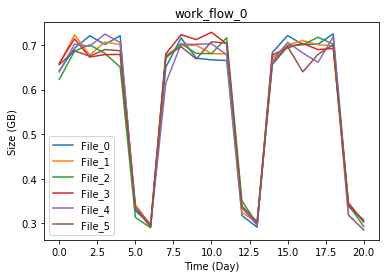

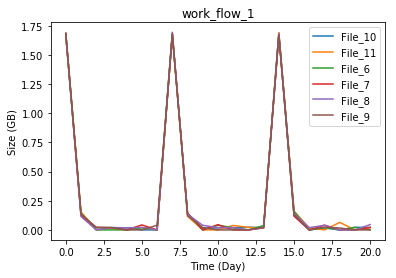

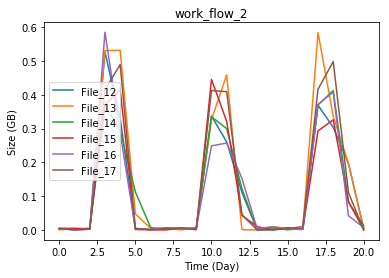

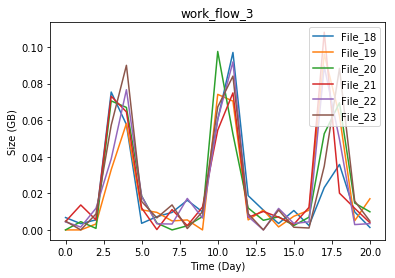

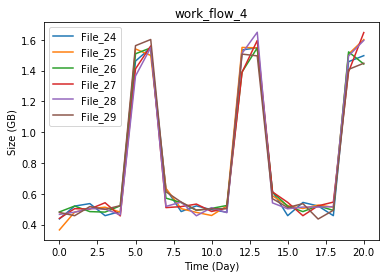

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = pd.read_csv('network_backup_dataset.csv', sep=',')

df1 = df.replace({'Day of Week': {'Monday': 0, 'Tuesday': 1, 'Wednesday': 2, 'Thursday': 3, 'Friday': 4,
                                   'Saturday': 5, 'Sunday': 6}})
df1['Day_num'] = df1[['Week #', 'Day of Week', 'Backup Start Time - Hour of Day']] \
    .apply(lambda x: (x['Week #'] - 1) * 7 + x['Day of Week'], axis=1)
df1 = df1[df1['Day_num'] <= 20]  # the first 20 days

df1 = df1.groupby('Work-Flow-ID')
for workflow_ID, group in df1:
    workflows = group.groupby('File Name')
    for file_name, workflow in workflows:
        
        Eachday= workflow.groupby('Day_num')
        DayBackup=Eachday['Size of Backup (GB)'].agg(np.sum)
        
        plt.plot(DayBackup, label=file_name)
        
    plt.xlabel('Time (Day)')
    plt.ylabel('Size (GB)')
    plt.legend(loc='best')
    plt.title(workflow_ID)
 
    plt.show()

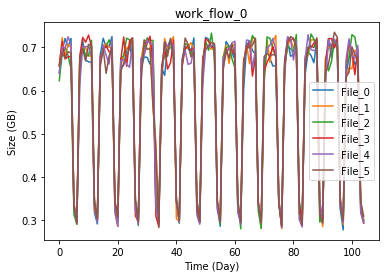

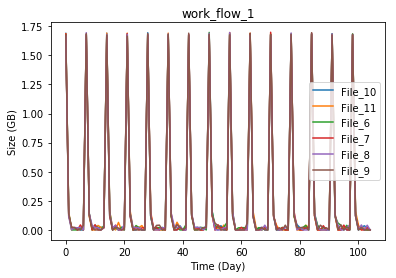

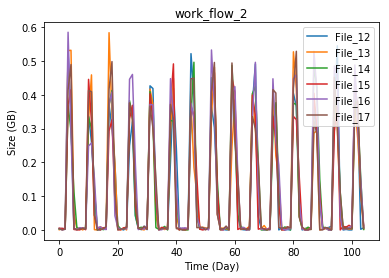

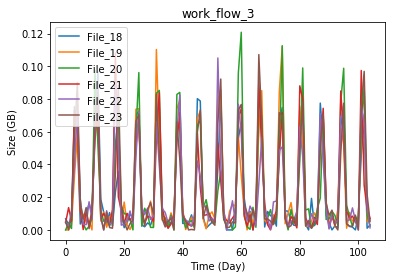

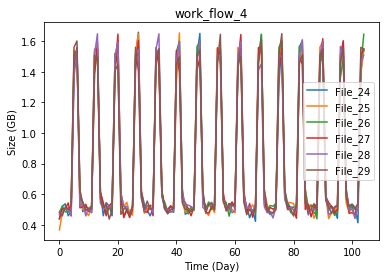

In [2]:
# 105 days
df2 = df.replace({'Day of Week': {'Monday': 0, 'Tuesday': 1, 'Wednesday': 2, 'Thursday': 3, 'Friday': 4,
                                   'Saturday': 5, 'Sunday': 6}})
df2['Day_num'] = df2[['Week #', 'Day of Week', 'Backup Start Time - Hour of Day']] \
    .apply(lambda x: (x['Week #'] - 1) * 7 + x['Day of Week'], axis=1)
df2 = df2[df2['Day_num'] <= 105]  # the first 105 days

df2 = df2.groupby('Work-Flow-ID')
for workflow_ID, group in df2:
    workflows = group.groupby('File Name')
    for file_name, workflow in workflows:
        Eachday= workflow.groupby('Day_num')
        DayBackup=Eachday['Size of Backup (GB)'].agg(np.sum)
        plt.plot(DayBackup, label=file_name)
        
    plt.xlabel('Time (Day)')
    plt.ylabel('Size (GB)')
    plt.legend(loc='best')
    plt.title(workflow_ID)
 
    plt.show()



# a Linear Regression

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn import datasets, linear_model, metrics
from sklearn.model_selection import cross_val_score,cross_val_predict,cross_validate
from sklearn.preprocessing import StandardScaler
from sklearn import feature_selection
from sklearn.preprocessing import OneHotEncoder

In [4]:
data = pd.read_csv('network_backup_dataset.csv')
data.columns = ['week', 'day_of_week', 'start_time','work_flow','file_name','size','duration']

In [5]:
# scalar encoding for week
day_of_week_set = {'Monday':1,'Tuesday':2,'Wednesday':3,'Thursday':4,'Friday':5, \
                   'Saturday':6,'Sunday':7}

day_of_week_column_to_be_added = []
for day_of_week_item in data['day_of_week']:
    day_of_week_column_to_be_added.append(day_of_week_set[day_of_week_item])

data.drop('day_of_week', 1, inplace = True)
data.insert(1, 'day_of_week', day_of_week_column_to_be_added)


In [6]:
#scalar encoding for workflow
work_flow_set = {'work_flow_0': 1,'work_flow_1':2,'work_flow_2':3,'work_flow_3':4,'work_flow_4':5}

work_flow_column_to_be_added = []
for work_flow_item in data['work_flow']:
    work_flow_column_to_be_added.append(work_flow_set[work_flow_item])

data.drop('work_flow', 1, inplace = True)
data.insert(3, 'work_flow', work_flow_column_to_be_added)

In [7]:
# scalar enconding for filename
file_name_set = {}

for file_name_item in data['file_name']:
    file_name_set[file_name_item] = int(str(file_name_item).split('_')[-1])
file_name_column_to_be_added = []
for file_name_item in data['file_name']:
    file_name_column_to_be_added.append(file_name_set[file_name_item])

data.drop('file_name', 1, inplace = True)
data.insert(4, 'file_name', file_name_column_to_be_added)

In [8]:
data.to_csv('revised_data.csv', index = False)
data = pd.read_csv('revised_data.csv')
X = data.copy()
X.drop('duration', 1, inplace = True)
y = X.pop('size')

In [9]:
def print_RMSEs_plot(features,targets,model):
    predicted = cross_val_predict(model, features, targets, cv=10)
    cv_scores = cross_validate(model, features, targets, cv=10, scoring='neg_mean_squared_error',return_train_score=True)

    Test_RMSE=(sum(cv_scores['test_score'])/-10.0)**0.5
    Train_RMSE=(sum(cv_scores['train_score'])/-10.0)**0.5

    print ("Test RMSE with cross validation: %0.7f"%Test_RMSE )
    print ("Train RMSE with cross validation: %0.7f"%Train_RMSE)

    print('')
    print("Fitted values vs. true values ")
    plt.figure(figsize=(12,4))
    plt.scatter(range(0,len(targets)), targets, s=1,label='true vlaues')
    plt.scatter(range(0,len(targets)), predicted,s=1, label='fitted values') 
    plt.legend(loc='best')
    plt.xlabel('Time')
    plt.ylabel('fitted values and true values')
    plt.show()

    #Residual
    print(" residuals vs. ﬁtted values ")
    y_residual =targets-predicted
    plt.figure(figsize=(12,4))
    plt.scatter(range(0,len(targets)), predicted,s=1, label='fitted values')
    plt.scatter(range(0,len(targets)), y_residual,s=1, label='residuals')
    plt.legend(loc='best')
    plt.xlabel('Time')
    plt.ylabel('Residual values and fitted values')
    plt.show()
    

Test RMSE with cross validation: 0.1036758
Train RMSE with cross validation: 0.1035854

Fitted values vs. true values 


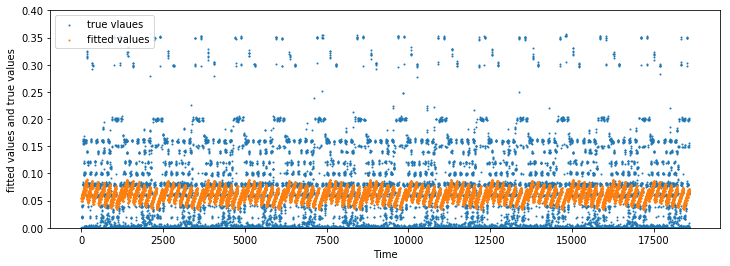

 residuals vs. ﬁtted values 


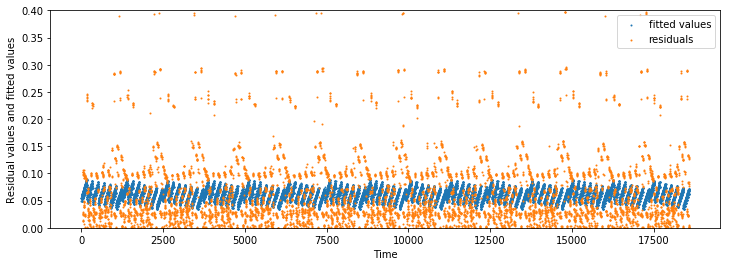

In [18]:
linear_regression = linear_model.LinearRegression()
print_RMSEs_plot(X,y,linear_regression)

## a ii Data Procession

Test RMSE with cross validation: 0.1036758
Train RMSE with cross validation: 0.1035854

Fitted values vs. true values 


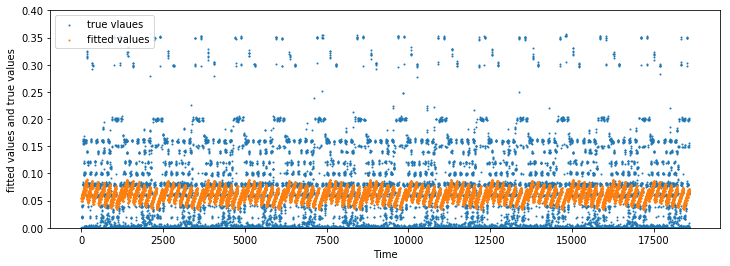

 residuals vs. ﬁtted values 


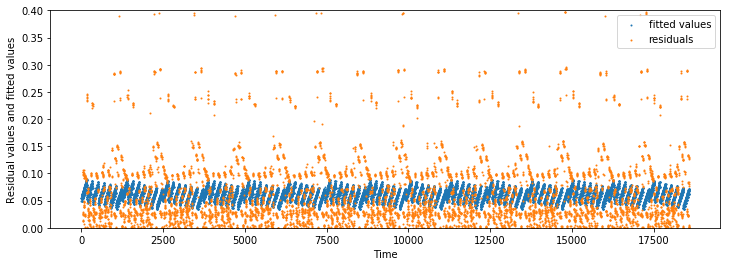

In [19]:
scalar=StandardScaler()
X_new=scalar.fit_transform(X,y)
print_RMSEs_plot(X_new,y,linear_regression)

## a iii Feature Selection

In [21]:
model = feature_selection.SelectKBest(score_func=feature_selection.f_regression,k=5)
results = model.fit(X, y)
print(results.scores_)
print(X.keys())

[  8.45006285e-03   3.88163795e+01   1.50740935e+02   2.61386654e+01
   2.53200943e+01]
Index(['week', 'day_of_week', 'start_time', 'work_flow', 'file_name'], dtype='object')


From f_regression, three most important variables are 'Start Time',  'Day of Week', 
and  'Work-Flow'.

Use these three most important variables to train a new linear model

Test RMSE with cross validation: 0.1036707
Train RMSE with cross validation: 0.1035857

Fitted values vs. true values 


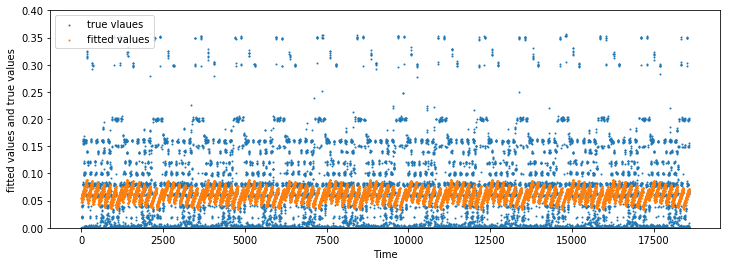

 residuals vs. ﬁtted values 


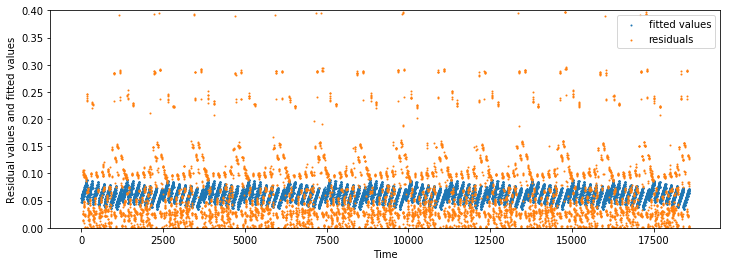

In [24]:
X = data.copy()
X.drop('duration', 1, inplace = True)
X_new=X[['day_of_week', 'start_time', 'work_flow']]
y = X.pop('size')

print_RMSEs_plot(X_new,y,linear_regression)

In [25]:
model2 = feature_selection.SelectKBest(score_func=feature_selection.mutual_info_regression,k=5)
results2 = model2.fit(X, y)
print(X.keys())
print(results2.scores_)

/Users/ericd/Downloads/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:444: DataConversionWarning: Data with input dtype int64 was converted to float64 by the scale function.
  warnings.warn(msg, DataConversionWarning)


Index(['week', 'day_of_week', 'start_time', 'work_flow', 'file_name'], dtype='object')
[ 0.00270929  0.22328277  0.24224216  0.71009406  0.43137242]


Test RMSE with cross validation: 0.1037723
Train RMSE with cross validation: 0.1036945

Fitted values vs. true values 


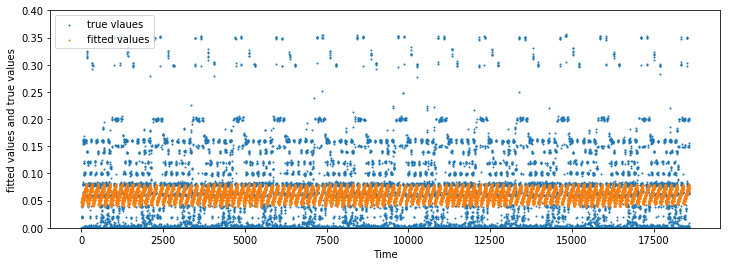

 residuals vs. ﬁtted values 


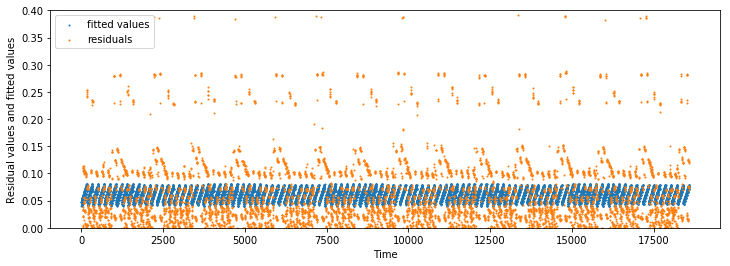

In [26]:
X = data.copy()
X.drop('duration', 1, inplace = True)
X_new=X[['file_name', 'start_time', 'work_flow']]
y = X.pop('size')

print_RMSEs_plot(X_new,y,linear_regression)

## a iv Feature Encoding

In [27]:
from itertools import combinations
def combination_sets(x):
    return [c for i in range(len(x)+1) for c in combinations(x,i)]

X = data.copy()
X.drop('duration', 1, inplace = True)
y = X.pop('size')

combos=combination_sets(range(5))

Train_RMSE vs. 32 combinations are following:
[0.10358539364103443, 0.10358047039335748, 0.10215309542913954, 0.10236167866029004, 0.091339536979517036, 0.091337271821277571, 0.10214926428876663, 0.10235579865464663, 0.091335162035380238, 0.091333452804033058, 0.10090681107057822, 0.089757340426602508, 0.089758058783149047, 0.089951035685934391, 0.089949977409781778, 0.091338414549183525, 0.10093862577872417, 0.089755454000113422, 0.089753719979886029, 0.089946296223524541, 0.08994497736885386, 0.091337231501412292, 0.088340170417797736, 0.088338209080693619, 0.089755616872367286, 0.089949169371673549, 0.088338302363779694, 0.088344550232281979, 0.089754098252090977, 0.089957063654969652, 0.08833860378887165, 0.08840188077831547]


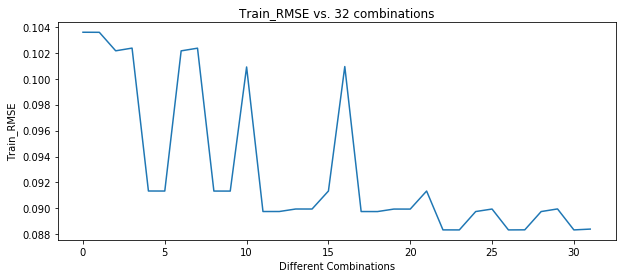

The min Train_RMSE is 0.088338
The best combos is
(1, 2, 4)



In [28]:
Test_RMSE=[]
Train_RMSE=[]
linear_regression = linear_model.LinearRegression()
for i in combos:
    if(i==()):
            cv_scores = cross_validate(linear_regression, X, y, cv=10, scoring='neg_mean_squared_error',return_train_score=True)
            TestRMSE=(sum(cv_scores['test_score'])/-10.0)**0.5
            TrainRMSE=(sum(cv_scores['train_score'])/-10.0)**0.5
            Test_RMSE.append(TestRMSE)
            Train_RMSE.append(TrainRMSE)
            
    else:
        hotendcode=OneHotEncoder(categorical_features=[i])
        X_temp=hotendcode.fit_transform(X).toarray()
        cv_scores = cross_validate(linear_regression, X_temp, y, cv=10, scoring='neg_mean_squared_error',return_train_score=True)
        TestRMSE=(sum(cv_scores['test_score'])/-10.0)**0.5
        TrainRMSE=(sum(cv_scores['train_score'])/-10.0)**0.5
        Test_RMSE.append(TestRMSE)
        Train_RMSE.append(TrainRMSE)
        
print('Train_RMSE vs. 32 combinations are following:')
print(Train_RMSE)
plt.figure(figsize=(10,4))
plt.plot(range(len(combos)),Train_RMSE)
plt.xlabel('Different Combinations')
plt.ylabel('Train_RMSE')
plt.title('Train_RMSE vs. 32 combinations')
plt.show()
print("The min Train_RMSE is %6f" %min(Train_RMSE))
min_index=np.argmin(Train_RMSE)
bestCombo=combos[min_index]
print("The best combos is")
print(bestCombo)
print('')

Test_RMSE vs. 32 combinations are following:
[0.10367584767428982, 9557766073.7297192, 0.10224955089677426, 0.10246697954204785, 0.091490813968880438, 0.09149790074914356, 15709588250.84584, 8295331488.6302128, 15127793239.656723, 18634023198.345299, 0.10101041052913685, 0.089910326540447366, 0.089914556815773178, 0.090118973236594138, 0.090123805121961373, 0.091498503376327978, 15971230700.314611, 19829907954.99474, 23757490465.200325, 13515645854.38872, 24867631112.619774, 26620007479.491001, 0.08851277707438035, 0.088506313029624681, 0.089917650683222217, 0.090123322156234975, 16236872607.999144, 173837944149.75098, 20123477951.47266, 94901419147.002731, 0.088507648351854956, 1333701912705.8308]


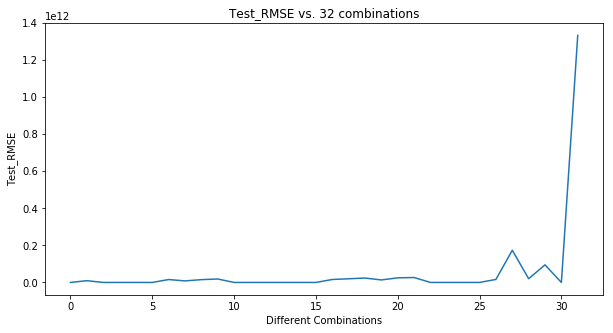

Note: Some points can not show in the graph since their values are super large compared with other points

The min Test_RMSE is 0.088506
The best combos is
(1, 2, 4)

Index(['week', 'day_of_week', 'start_time', 'work_flow', 'file_name'], dtype='object')


In [29]:

print('Test_RMSE vs. 32 combinations are following:')
print(Test_RMSE)
plt.figure(figsize=(10,5))
plt.plot(range(len(combos)),Test_RMSE)
plt.xlabel('Different Combinations')
plt.ylabel('Test_RMSE')
plt.title('Test_RMSE vs. 32 combinations')
plt.show()
print("Note: Some points can not show in the graph since their values are super large compared with other points")
print('')
print("The min Test_RMSE is %6f" %min(Test_RMSE))
min_index=np.argmin(Test_RMSE)
bestCombo=combos[min_index]
print("The best combos is")
print(bestCombo)
print('')
print(X.keys())

Test RMSE with cross validation: 0.0885063
Train RMSE with cross validation: 0.0883382

Fitted values vs. true values 


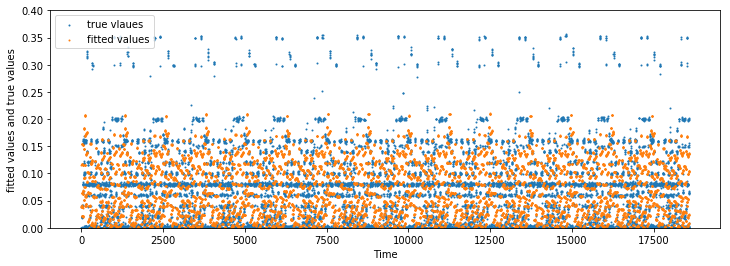

 residuals vs. ﬁtted values 


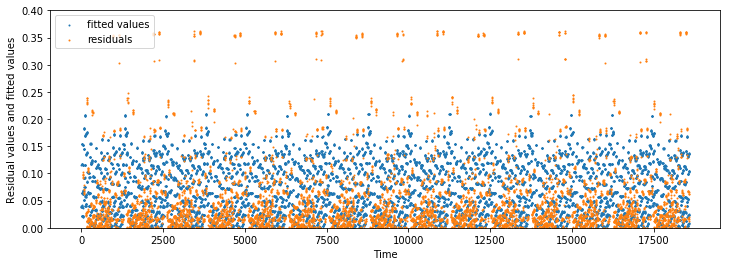

In [30]:
hotendcode=OneHotEncoder(categorical_features=[1,2,4])
X_temp=hotendcode.fit_transform(X).toarray()
print_RMSEs_plot(X_temp,y,linear_regression)

## Controlling ill-conditioning and over-fiting

### Ridge Regularizer

In [31]:
from sklearn.linear_model import Ridge
alphas=[0.1, 0.5, 1, 1.5, 2, 5, 9,10,10.5, 11, 12,15]
clf = Ridge(alpha=10.5)
Test_RMSE=[]
Train_RMSE=[]
for i in combos:
    if(i==()):
            
            cv_scores = cross_validate(clf, X, y, cv=10, scoring='neg_mean_squared_error',return_train_score=True)
            TestRMSE=(sum(cv_scores['test_score'])/-10.0)**0.5
            TrainRMSE=(sum(cv_scores['train_score'])/-10.0)**0.5
            Test_RMSE.append(TestRMSE)
            Train_RMSE.append(TrainRMSE)
            
    else:
        hotendcode=OneHotEncoder(categorical_features=[i])
        X_temp=hotendcode.fit_transform(X).toarray()
        cv_scores = cross_validate(clf, X_temp, y, cv=10, scoring='neg_mean_squared_error',return_train_score=True)
        TestRMSE=(sum(cv_scores['test_score'])/-10.0)**0.5
        TrainRMSE=(sum(cv_scores['train_score'])/-10.0)**0.5
        Test_RMSE.append(TestRMSE)
        Train_RMSE.append(TrainRMSE)


min_index=np.argmin(Test_RMSE)
bestCombo=combos[min_index]   

print('Test_RMSE values vs. 32 combinations are following:')

print(Test_RMSE)
print('')
print(min(Test_RMSE))
print(bestCombo)

Test_RMSE values vs. 32 combinations are following:
[0.10367582295931185, 0.10386588378780284, 0.10223183993542907, 0.1024654853983939, 0.091497039248745665, 0.091501735796192321, 0.10232254905792353, 0.10267077929486854, 0.091617958145281939, 0.09162380796516699, 0.10100026684664849, 0.089906524815619671, 0.089911262964787186, 0.090123634056277074, 0.090128427531909722, 0.091498124667703851, 0.10110699738737942, 0.089931659945480164, 0.089937277409145755, 0.090252302304663481, 0.090258418530730536, 0.091619161472818816, 0.088503993284384741, 0.088508825301337413, 0.089907626954332659, 0.09012473226611209, 0.088537592953153652, 0.088543476584879488, 0.089932873077968337, 0.090253526977663659, 0.088505100662652839, 0.088538824718214754]

0.0885039932844
(1, 2, 3)


Test RMSE with cross validation: 0.0885040
Train RMSE with cross validation: 0.0883377

Fitted values vs. true values 


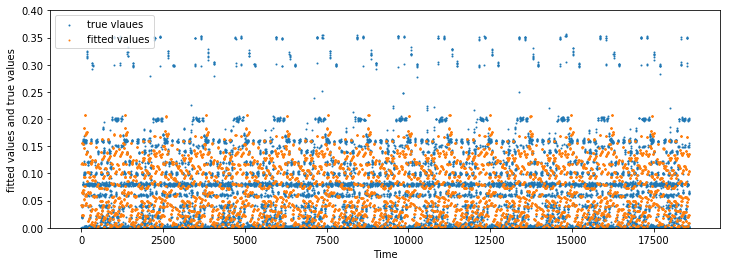

 residuals vs. ﬁtted values 


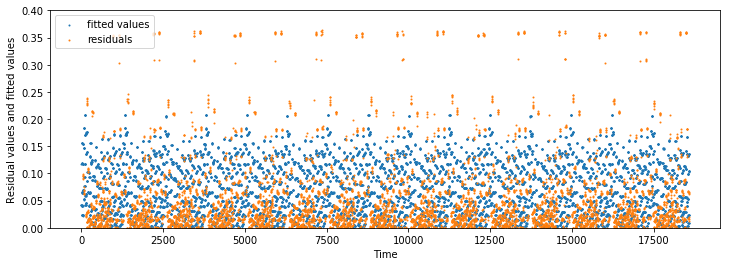

In [32]:
hotendcode=OneHotEncoder(categorical_features=[1,2,3])
X_temp=hotendcode.fit_transform(X).toarray()
print_RMSEs_plot(X_temp,y,clf)

#### for Lasso Regularizer

In [33]:
from sklearn import linear_model
alphas=[0.0001,0.0002,0.0005,0.001,0.002,0.005,0.1,1] 
clf = linear_model.Lasso(alpha=0.0001)

Test_RMSE=[]
Train_RMSE=[]
for i in combos:
    if(i==()): 
        cv_scores = cross_validate(clf, X, y, cv=10, scoring='neg_mean_squared_error',return_train_score=True)
        TestRMSE=(sum(cv_scores['test_score'])/-10.0)**0.5
        TrainRMSE=(sum(cv_scores['train_score'])/-10.0)**0.5
        Test_RMSE.append(TestRMSE)
        Train_RMSE.append(TrainRMSE)
            
    else:
        hotendcode=OneHotEncoder(categorical_features=[i])
        X_temp=hotendcode.fit_transform(X).toarray()
        cv_scores = cross_validate(clf, X_temp, y, cv=10, scoring='neg_mean_squared_error',return_train_score=True)
        TestRMSE=(sum(cv_scores['test_score'])/-10.0)**0.5
        TrainRMSE=(sum(cv_scores['train_score'])/-10.0)**0.5
        Test_RMSE.append(TestRMSE)
        Train_RMSE.append(TrainRMSE)


min_index=np.argmin(Test_RMSE)
bestCombo=combos[min_index]

print(Test_RMSE)

print(min(Test_RMSE))
print(bestCombo)



[0.10367565102946735, 0.10370379164667547, 0.10223313954560803, 0.10246700415444818, 0.091498094429437959, 0.091532117102128774, 0.10223232970858045, 0.10249423457487944, 0.091521150799889692, 0.091555761498361796, 0.10100331558022795, 0.089909615698103268, 0.089944267548297097, 0.090126708802731159, 0.090160949856231035, 0.091497659078388291, 0.10100253011539174, 0.089908856426194492, 0.089943490503120879, 0.090148514682737796, 0.090183351754615768, 0.091520717133033072, 0.08850938913087332, 0.088544390663597414, 0.089909157134601098, 0.09012626548356853, 0.088508694729903248, 0.088543678776572488, 0.089908397663395576, 0.090148073433923115, 0.088508943817570254, 0.088508249250600857]
0.0885082492506
(0, 1, 2, 3, 4)


Test RMSE with cross validation: 0.0885082
Train RMSE with cross validation: 0.0883430

Fitted values vs. true values 


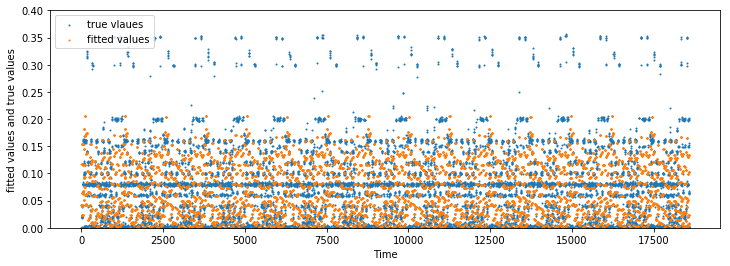

 residuals vs. ﬁtted values 


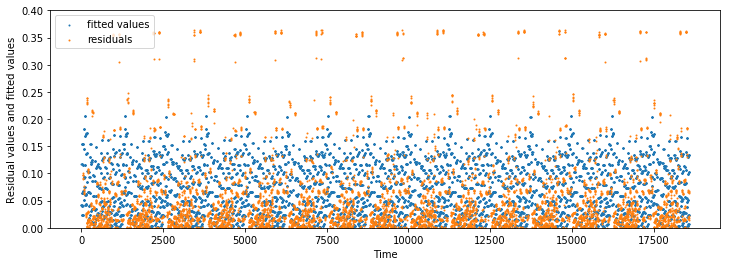

In [34]:
hotendcode=OneHotEncoder(categorical_features=[0,1,2,3,4])
X_temp=hotendcode.fit_transform(X).toarray()
print_RMSEs_plot(X_temp,y,clf)


#### For Elastic Net Regularizer

In [35]:
alphas=[0.0001,0.0002,0.0005,0.001,0.002,0.005,0.1,1] 

from sklearn.linear_model import ElasticNet
#lambda1 =alpha*l1_ratio
#lambda2 =alpha*(1-l1_ratio)

clf = ElasticNet(alpha=10.0, l1_ratio=0.001)
Test_RMSE=[]
Train_RMSE=[]
for i in combos:
    if(i==()): 
        cv_scores = cross_validate(clf, X, y, cv=10, scoring='neg_mean_squared_error',return_train_score=True)
        TestRMSE=(sum(cv_scores['test_score'])/-10.0)**0.5
        TrainRMSE=(sum(cv_scores['train_score'])/-10.0)**0.5
        Test_RMSE.append(TestRMSE)
        Train_RMSE.append(TrainRMSE)
            
    else:
        hotendcode=OneHotEncoder(categorical_features=[i])
        X_temp=hotendcode.fit_transform(X).toarray()
        cv_scores = cross_validate(clf, X_temp, y, cv=10, scoring='neg_mean_squared_error',return_train_score=True)
        TestRMSE=(sum(cv_scores['test_score'])/-10.0)**0.5
        TrainRMSE=(sum(cv_scores['train_score'])/-10.0)**0.5
        Test_RMSE.append(TestRMSE)
        Train_RMSE.append(TrainRMSE)


        
        
min_index=np.argmin(Test_RMSE)
bestCombo=combos[min_index]

print(Test_RMSE)

print(min(Test_RMSE))
print(bestCombo)

[0.10381232743103028, 0.10381232743103028, 0.10381232743103028, 0.10418954520693066, 0.10373635568460052, 0.10381094895966489, 0.10381232743103028, 0.10418954520693066, 0.10373635568460052, 0.10381094895966489, 0.10418954520693066, 0.10373635568460052, 0.10381094895966489, 0.10411392152671491, 0.10419023788428682, 0.10372728590423942, 0.10418954520693066, 0.10373635568460052, 0.10381094895966489, 0.10411392152671491, 0.10419023788428682, 0.10372728590423942, 0.10411392152671491, 0.10419023788428682, 0.10372728590423942, 0.1041068067387821, 0.10411392152671491, 0.10419023788428682, 0.10372728590423942, 0.1041068067387821, 0.1041068067387821, 0.1041068067387821]
0.103727285904
(3, 4)


In [36]:
alphas=[1,2,5,10,15]
l1_ratios=[0.01,0.02,0.05,0.1, 0.5,0.9]
Min_Test_RMSE=[]
Min_Error_combo=[]
alpha_L1ratio=[]
for a in alphas:
    for l1 in l1_ratios:
        print("alpha = %d"%a , ", l1_ratio = %0.2f \n" %l1 )
        clf = ElasticNet(alpha=a, l1_ratio=l1)
        Test_RMSE=[]
        Train_RMSE=[]
        for i in combos:
            if(i==()): 
                cv_scores = cross_validate(clf, X, y, cv=10, scoring='neg_mean_squared_error',return_train_score=True)
                TestRMSE=(sum(cv_scores['test_score'])/-10.0)**0.5
                TrainRMSE=(sum(cv_scores['train_score'])/-10.0)**0.5
                Test_RMSE.append(TestRMSE)
                Train_RMSE.append(TrainRMSE)
            
            else:
                hotendcode=OneHotEncoder(categorical_features=[i])
                X_temp=hotendcode.fit_transform(X).toarray()
                cv_scores = cross_validate(clf, X_temp, y, cv=10, scoring='neg_mean_squared_error',return_train_score=True)
                TestRMSE=(sum(cv_scores['test_score'])/-10.0)**0.5
                TrainRMSE=(sum(cv_scores['train_score'])/-10.0)**0.5
                Test_RMSE.append(TestRMSE)
                Train_RMSE.append(TrainRMSE)
                
        min_index=np.argmin(Test_RMSE)
        bestCombo=combos[min_index]
        
        print("The minimum Test_RMSE is %f" %min(Test_RMSE))
        print("The one hot encoding combination is: ")
        print(bestCombo,"\n")
        
        Min_Test_RMSE.append(min(Test_RMSE))
        Min_Error_combo.append(bestCombo)
        alpha_L1ratio.append([a,l1])

alpha = 1 , l1_ratio = 0.01 

The minimum Test_RMSE is 0.103080
The one hot encoding combination is: 
(3, 4) 

alpha = 1 , l1_ratio = 0.02 

The minimum Test_RMSE is 0.103817
The one hot encoding combination is: 
(4,) 

alpha = 1 , l1_ratio = 0.05 

The minimum Test_RMSE is 0.104033
The one hot encoding combination is: 
() 

alpha = 1 , l1_ratio = 0.10 

The minimum Test_RMSE is 0.104190
The one hot encoding combination is: 
() 

alpha = 1 , l1_ratio = 0.50 

The minimum Test_RMSE is 0.104190
The one hot encoding combination is: 
() 

alpha = 1 , l1_ratio = 0.90 

The minimum Test_RMSE is 0.104190
The one hot encoding combination is: 
() 

alpha = 2 , l1_ratio = 0.01 

The minimum Test_RMSE is 0.103821
The one hot encoding combination is: 
(4,) 

alpha = 2 , l1_ratio = 0.02 

The minimum Test_RMSE is 0.103945
The one hot encoding combination is: 
(4,) 

alpha = 2 , l1_ratio = 0.05 

The minimum Test_RMSE is 0.104190
The one hot encoding combination is: 
() 

alpha = 2 , l1_ratio = 0.10

In [37]:
min_error_index=np.argmin(Min_Test_RMSE)
min_combination=Min_Error_combo[min_error_index]
min_alpha_L1ratio=alpha_L1ratio[min_error_index]
print("When choose alpha and L1ratio equals to " , min_alpha_L1ratio)
print("and One hot encoding combination is",min_combination) # which corrsponding to Work-Flow-ID', 'File Name'
print("get the minimum Test_RMSE :%f" %min(Min_Test_RMSE))
#find that when lambda1 decrease, error decrese

When choose alpha and L1ratio equals to  [1, 0.01]
and One hot encoding combination is (3, 4)
get the minimum Test_RMSE :0.103080


Test RMSE with cross validation: 0.1030802
Train RMSE with cross validation: 0.1030681

Fitted values vs. true values 


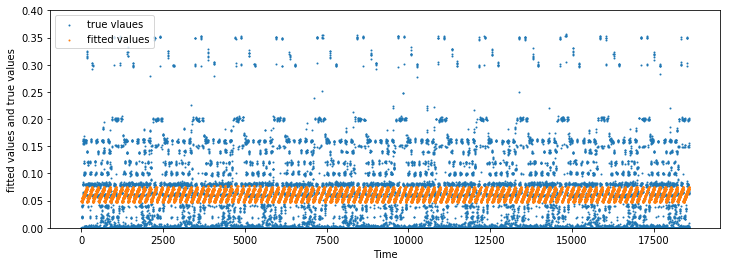

 residuals vs. ﬁtted values 


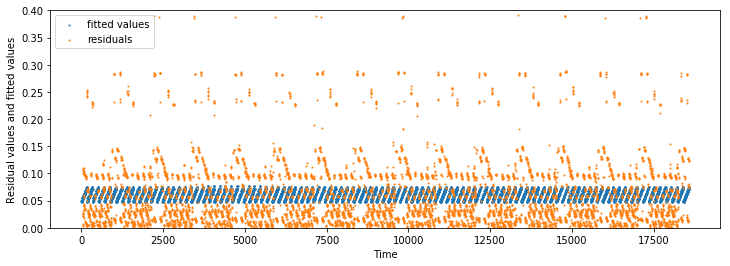

In [38]:
#lambda1 =alpha*l1_ratio
#lambda2 =alpha*(1-l1_ratio)

#lambda1=0.01, lambda2=0.99
clf = ElasticNet(alpha=1, l1_ratio=0.01)
hotendcode=OneHotEncoder(categorical_features=[3,4])
X_temp=hotendcode.fit_transform(X).toarray()
print_RMSEs_plot(X_temp,y,clf)

# random forest regression

Test RMSE with cross validation: 0.0605150
Train RMSE with cross validation: 0.0603017

Fitted values vs. true values 


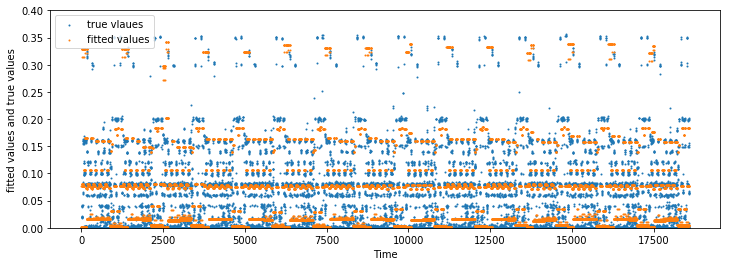

 residuals vs. ﬁtted values 


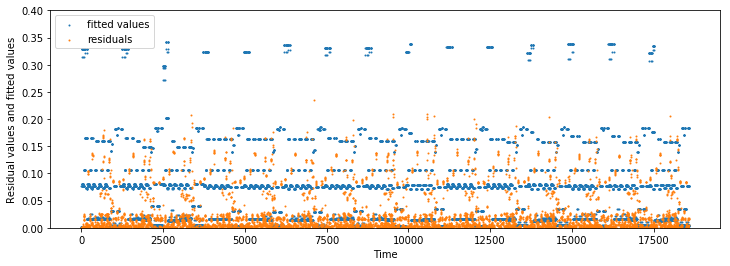

Out Of Bag error: 0.335498030454


In [33]:
from sklearn.ensemble import RandomForestRegressor

X = data.copy()
X.drop('duration', 1, inplace = True)
y = X.pop('size')
forest_regression = RandomForestRegressor(n_estimators = 20, max_depth = 4, max_features=5, bootstrap=True, oob_score=True)
print_RMSEs_plot(X,y,forest_regression)
a = forest_regression.fit(X,y)
print('Out Of Bag error:',1 - a.oob_score_)

## ii

optimal n_estimator: 18
out of bag error against number of trees with 1 features


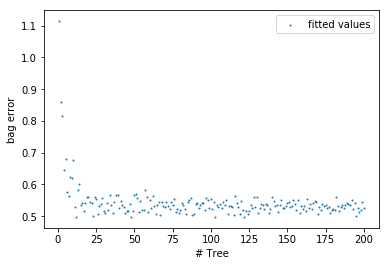

average Test-RMSE against number of trees with 1 features


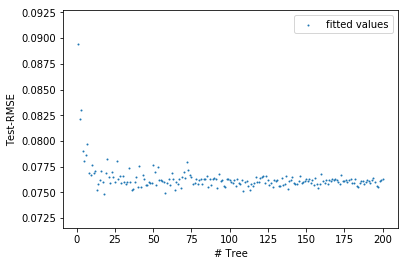

optimal n_estimator: 25
out of bag error against number of trees with 2 features


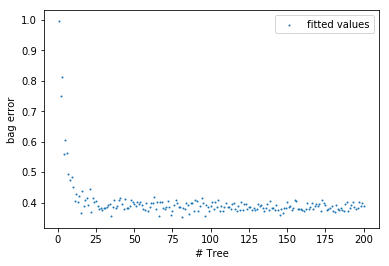

average Test-RMSE against number of trees with 2 features


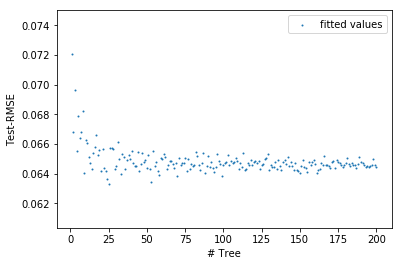

optimal n_estimator: 19
out of bag error against number of trees with 3 features


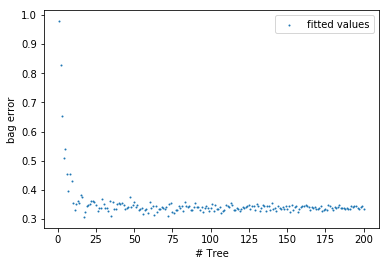

average Test-RMSE against number of trees with 3 features


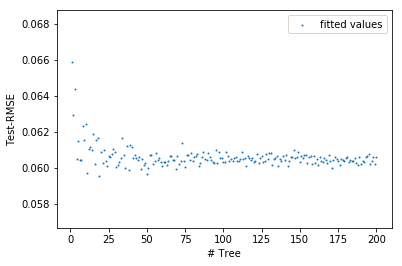

optimal n_estimator: 27
out of bag error against number of trees with 4 features


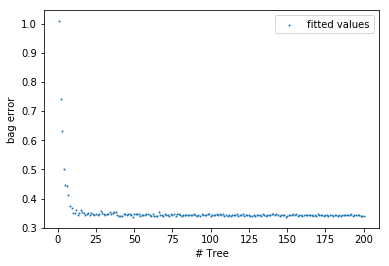

average Test-RMSE against number of trees with 4 features


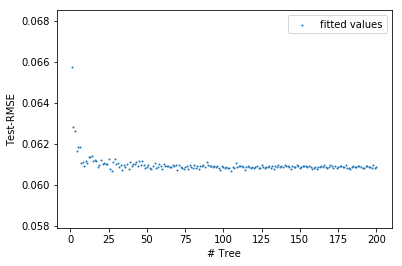

optimal n_estimator: 16
out of bag error against number of trees with 5 features


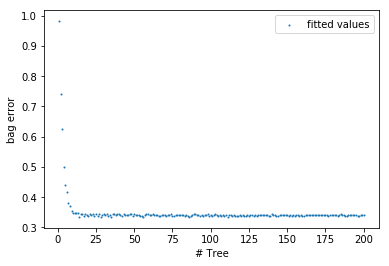

average Test-RMSE against number of trees with 5 features


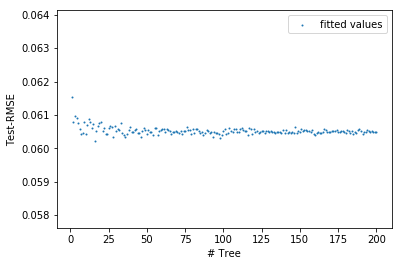

In [36]:
import warnings
warnings.filterwarnings("ignore")


for max_feature in range(1,6):
    
    oob = []
    TRMSE = []
    
    for n_estimator in range(1,201):
        X = data.copy()
        X.drop('duration', 1, inplace = True)
        y = X.pop('size')
        forest_regression = RandomForestRegressor(n_estimators = n_estimator, max_depth = 4, max_features=max_feature, \
                                                  bootstrap=True, oob_score=True)
        a = forest_regression.fit(X,y)
        oob.append(1-a.oob_score_)
        
        predicted = cross_val_predict(forest_regression, X, y, cv=10)
        cv_scores = cross_validate(forest_regression, X, y, cv=10, scoring='neg_mean_squared_error',return_train_score=True)
        Test_RMSE=(sum(cv_scores['test_score'])/-10.0)**0.5
        TRMSE.append(Test_RMSE)
    
    cal = TRMSE + oob
    idx = cal.index(min(cal)) + 1
    print('optimal n_estimator:', idx)


    print("out of bag error against number of trees with %d features" %(max_feature))
    plt.scatter(range(1,201), oob ,s=1, label='fitted values') 
    plt.legend(loc='best')
    plt.xlabel('# Tree')
    plt.ylabel('bag error')
    plt.show()

    print("average Test-RMSE against number of trees with %d features" %(max_feature))
    plt.scatter(range(1,201), TRMSE ,s=1, label='fitted values') 
    plt.legend(loc='best')
    plt.xlabel('# Tree')
    plt.ylabel('Test-RMSE')
    plt.show()


## iii

out of bag error against number of trees with min_samples_leaf


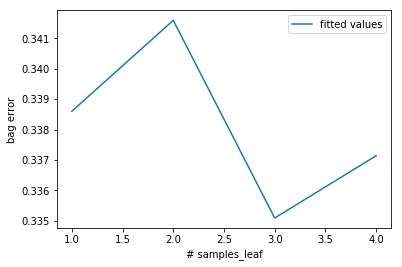

average Test-RMSE against number of trees with min_samples_leaf


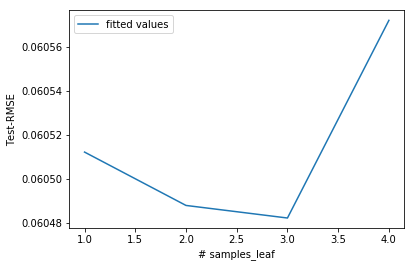

In [50]:
 
oob = []
TRMSE = []

for min_samples_leaff in range(1,5):
    X = data.copy()
    X.drop('duration', 1, inplace = True)
    y = X.pop('size')
    forest_regression = RandomForestRegressor(n_estimators = 150, max_depth = 4, max_features=5, \
                                              bootstrap=True, oob_score=True, min_samples_leaf = min_samples_leaff)
    a = forest_regression.fit(X,y)
    oob.append(1-a.oob_score_)

    predicted = cross_val_predict(forest_regression, X, y, cv=10)
    cv_scores = cross_validate(forest_regression, X, y, cv=10, scoring='neg_mean_squared_error',return_train_score=True)
    Test_RMSE=(sum(cv_scores['test_score'])/-10.0)**0.5
    TRMSE.append(Test_RMSE)


print("out of bag error against number of trees with min_samples_leaf")
plt.plot(range(1,5), oob ,label='fitted values') 
plt.legend(loc='best')
plt.xlabel('# samples_leaf')
plt.ylabel('bag error')
plt.show()

print("average Test-RMSE against number of trees with min_samples_leaf")
plt.plot(range(1,5), TRMSE , label='fitted values') 
plt.legend(loc='best')
plt.xlabel('# samples_leaf')
plt.ylabel('Test-RMSE')
plt.show()



## iv Feature Improtance

In [79]:
rf = RandomForestRegressor(n_estimators=170, max_depth=4, bootstrap=True, max_features=5,  \
                           oob_score=True,min_samples_leaf = 3)
rf.fit(X,y)
rf.feature_importances_ 

array([  6.19200047e-06,   2.73280579e-01,   1.50871334e-01,
         2.15484217e-01,   3.60357678e-01])

## v Visualize your decision trees

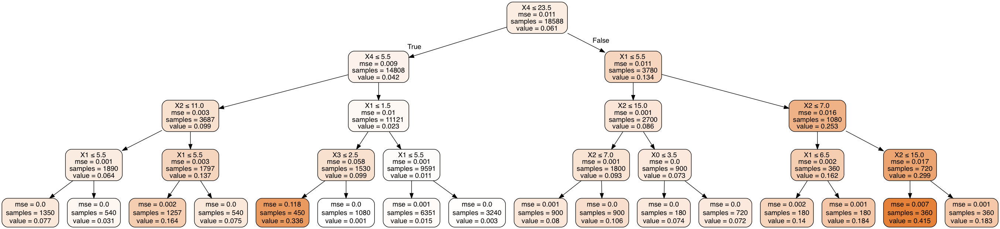

In [78]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn import tree
from sklearn.model_selection import cross_val_score,cross_val_predict,cross_validate
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
from sklearn.tree import DecisionTreeRegressor
dtree=DecisionTreeRegressor(max_depth=4,max_features=5)
dtree.fit(X,y)
dot_data = StringIO()

export_graphviz(dtree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

# neural network regression

In [53]:
from sklearn.preprocessing import OneHotEncoder
from sklearn import datasets, linear_model, metrics
from sklearn.neural_network import MLPRegressor

X = data.copy()
X.drop('duration', 1, inplace = True)
y = X.pop('size')
enc = OneHotEncoder()
X_enc = enc.fit_transform(X)

hidden_units:5
Test RMSE with cross validation: 0.0866618
Train RMSE with cross validation: 0.0857770

Fitted values vs. true values 


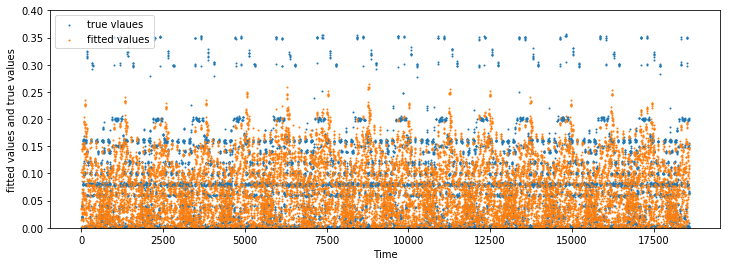

 residuals vs. ﬁtted values 


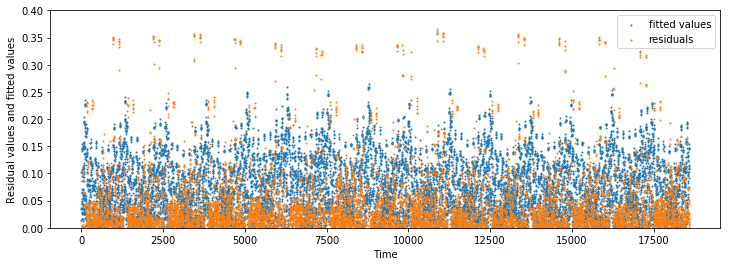

hidden_units:15
Test RMSE with cross validation: 0.0433685
Train RMSE with cross validation: 0.0294423

Fitted values vs. true values 


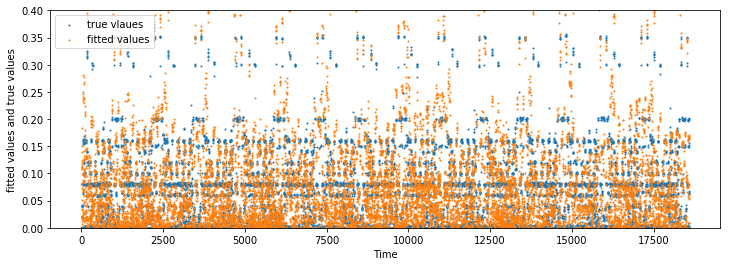

 residuals vs. ﬁtted values 


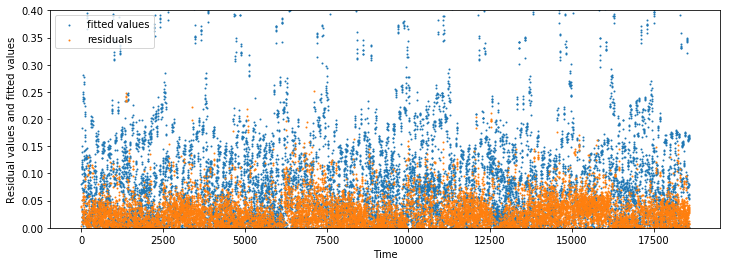

hidden_units:25
Test RMSE with cross validation: 0.1028732
Train RMSE with cross validation: 0.0332647

Fitted values vs. true values 


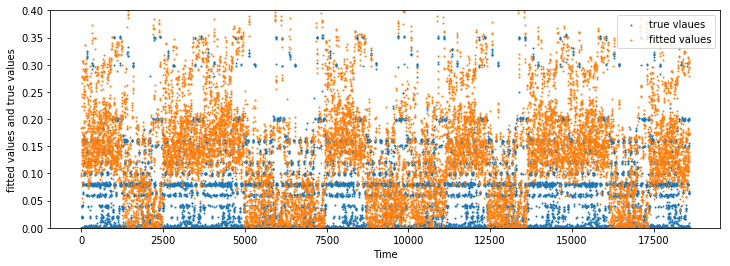

 residuals vs. ﬁtted values 


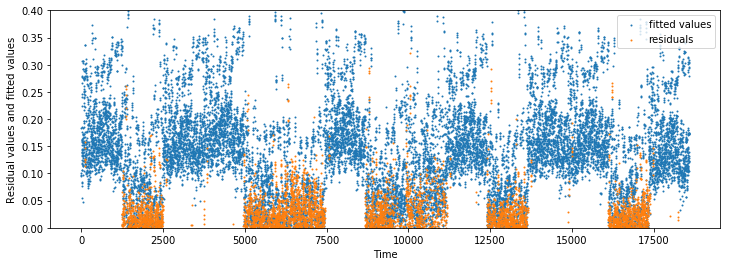

hidden_units:35
Test RMSE with cross validation: 0.0470812
Train RMSE with cross validation: 0.0256184

Fitted values vs. true values 


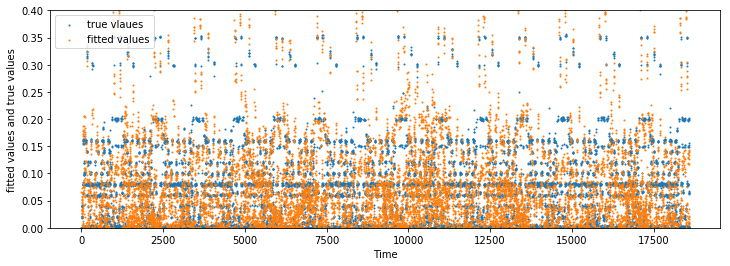

 residuals vs. ﬁtted values 


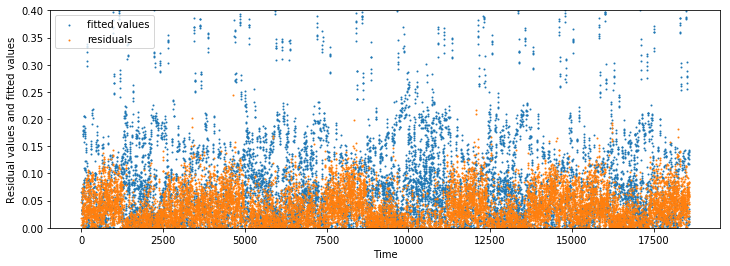

hidden_units:45
Test RMSE with cross validation: 0.0335226
Train RMSE with cross validation: 0.0243424

Fitted values vs. true values 


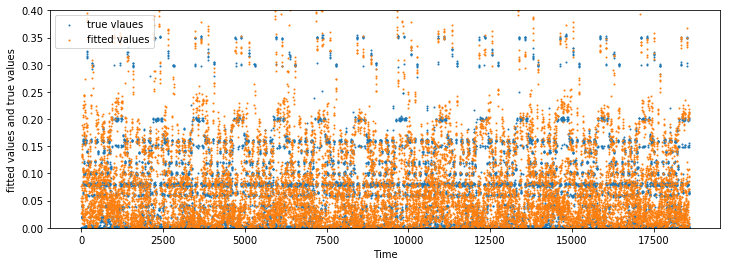

 residuals vs. ﬁtted values 


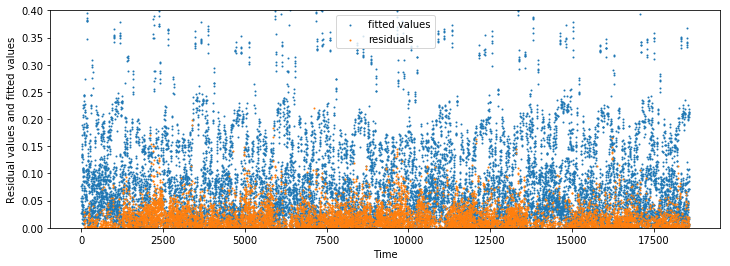

hidden_units:55
Test RMSE with cross validation: 0.0343067
Train RMSE with cross validation: 0.0238233

Fitted values vs. true values 


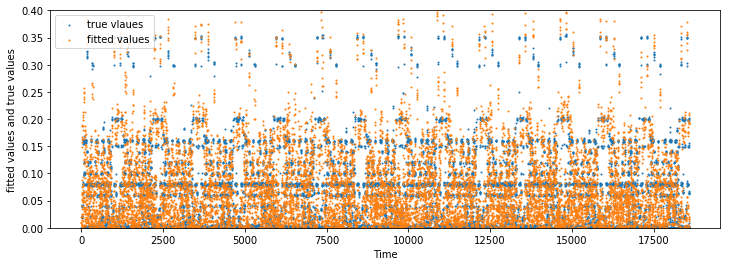

 residuals vs. ﬁtted values 


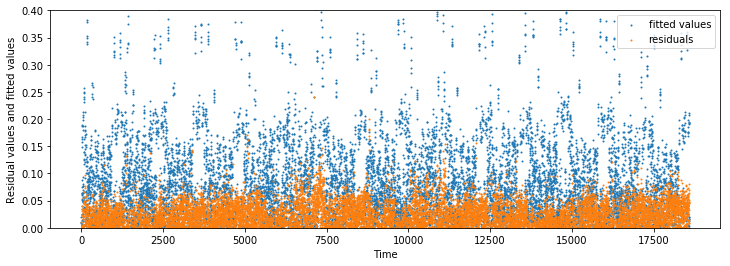

hidden_units:65
Test RMSE with cross validation: 0.0421932
Train RMSE with cross validation: 0.0281629

Fitted values vs. true values 


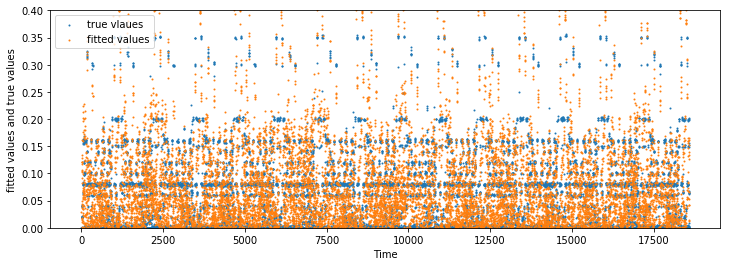

 residuals vs. ﬁtted values 


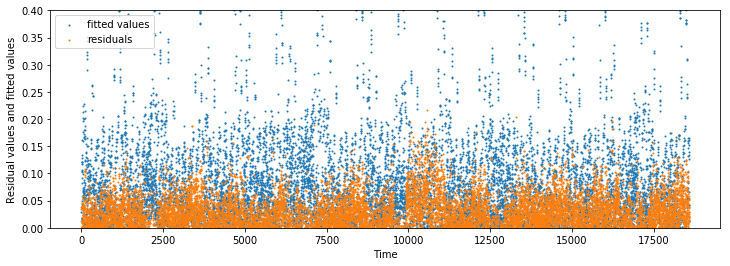

hidden_units:75
Test RMSE with cross validation: 0.0549438
Train RMSE with cross validation: 0.0270968

Fitted values vs. true values 


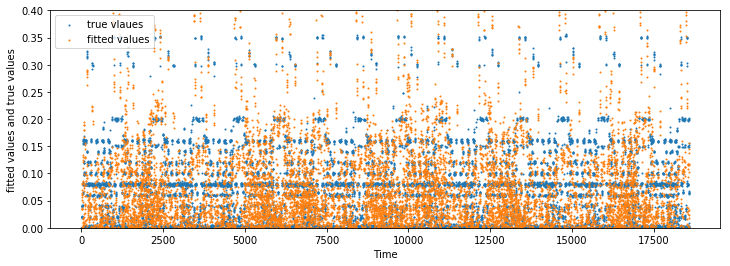

 residuals vs. ﬁtted values 


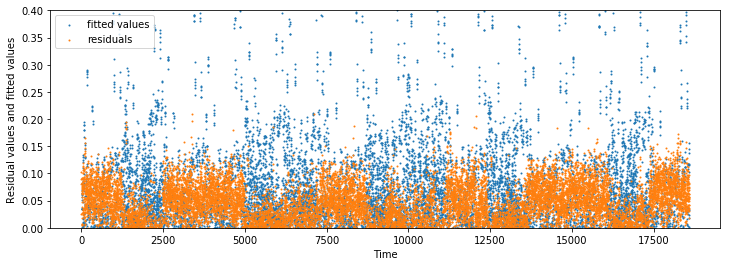

hidden_units:85
Test RMSE with cross validation: 0.0367662
Train RMSE with cross validation: 0.0203984

Fitted values vs. true values 


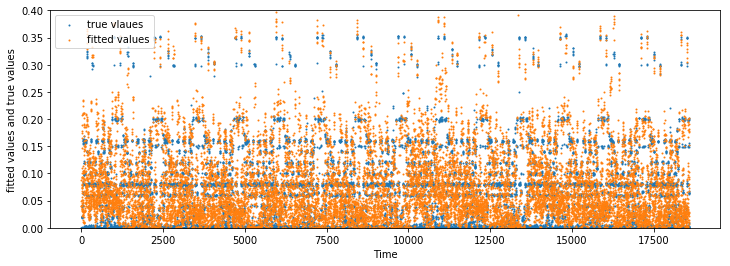

 residuals vs. ﬁtted values 


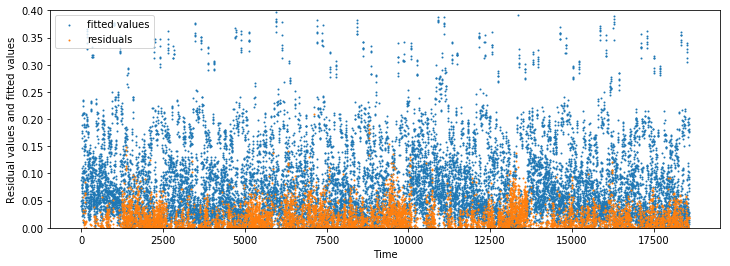

hidden_units:95
Test RMSE with cross validation: 0.0547244
Train RMSE with cross validation: 0.0224440

Fitted values vs. true values 


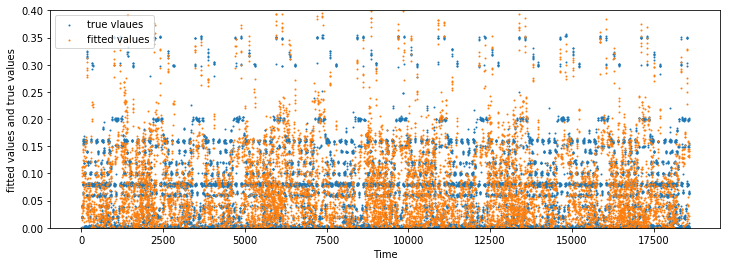

 residuals vs. ﬁtted values 


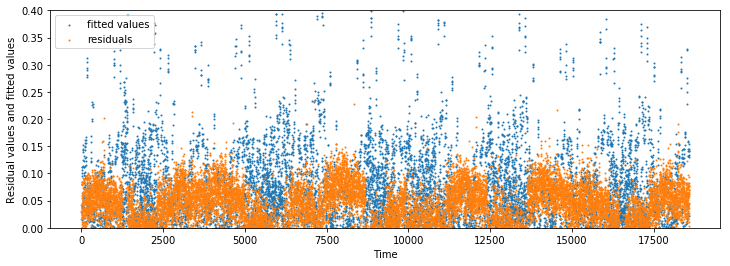

In [54]:
for hidden_units in range(5,105,10):
    print('hidden_units:%d'%hidden_units)
    clf_relu = MLPRegressor(activation='relu', alpha=1e-5,hidden_layer_sizes=(hidden_units,), random_state=1)
    print_RMSEs_plot(X_enc,y,clf_relu)

hidden_units:5
Test RMSE with cross validation: 0.0903741
Train RMSE with cross validation: 0.0886132

Fitted values vs. true values 


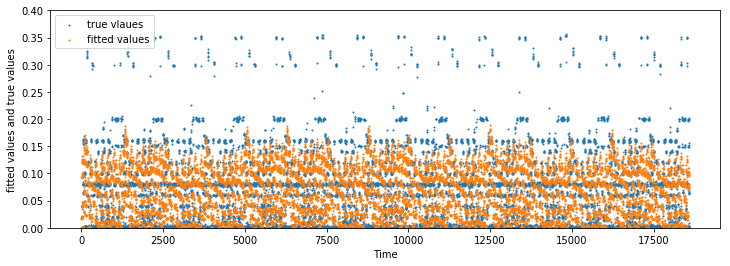

 residuals vs. ﬁtted values 


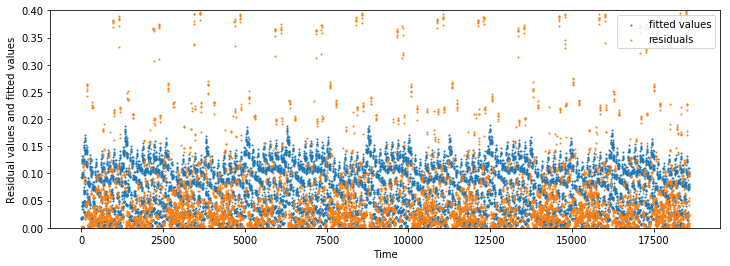

hidden_units:15
Test RMSE with cross validation: 0.0904965
Train RMSE with cross validation: 0.0883978

Fitted values vs. true values 


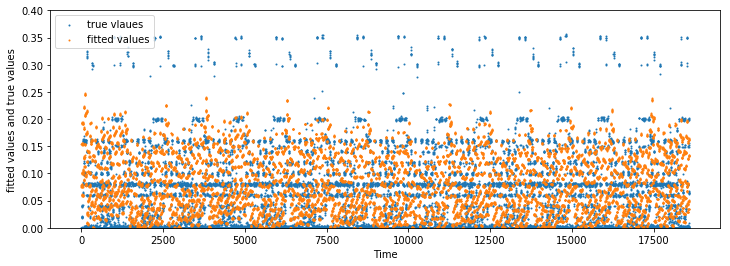

 residuals vs. ﬁtted values 


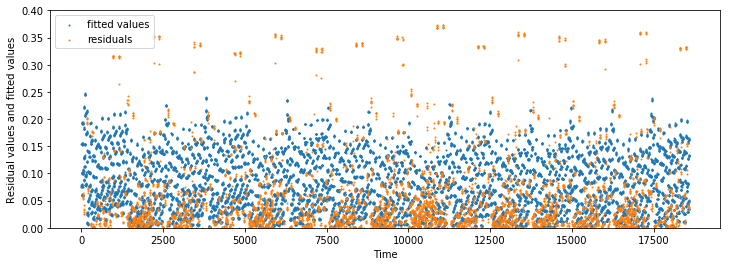

hidden_units:25
Test RMSE with cross validation: 0.0907964
Train RMSE with cross validation: 0.0884249

Fitted values vs. true values 


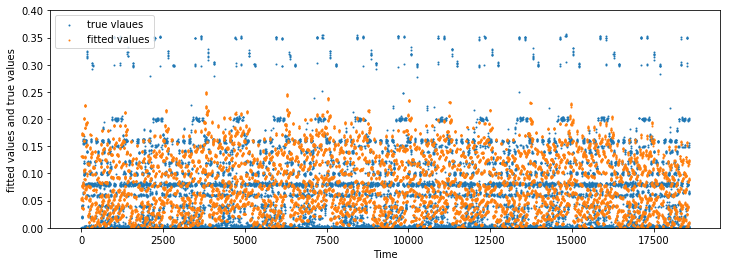

 residuals vs. ﬁtted values 


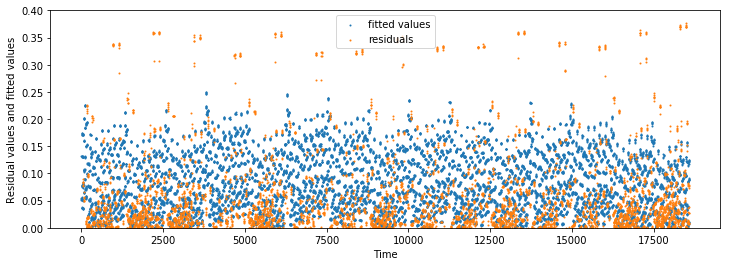

hidden_units:35
Test RMSE with cross validation: 0.0912045
Train RMSE with cross validation: 0.0887311

Fitted values vs. true values 


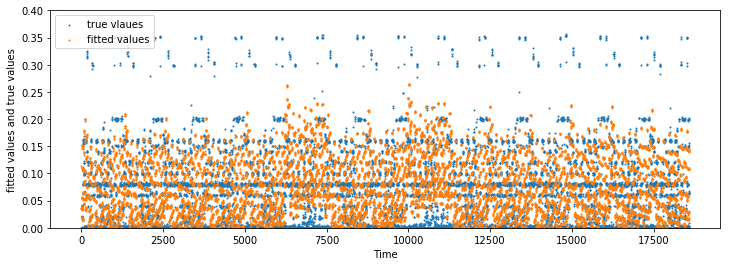

 residuals vs. ﬁtted values 


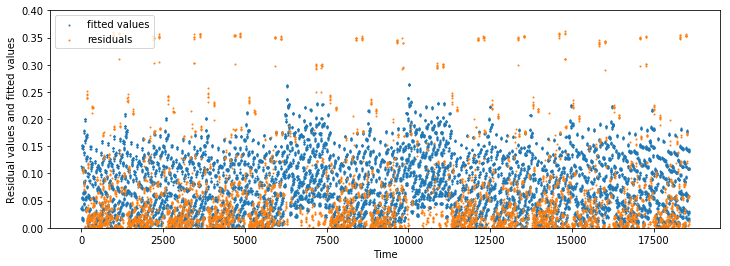

hidden_units:45
Test RMSE with cross validation: 0.0898509
Train RMSE with cross validation: 0.0888340

Fitted values vs. true values 


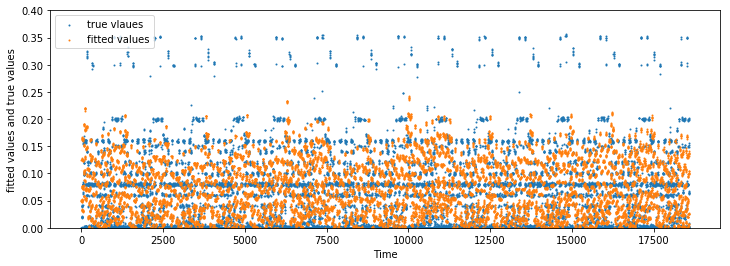

 residuals vs. ﬁtted values 


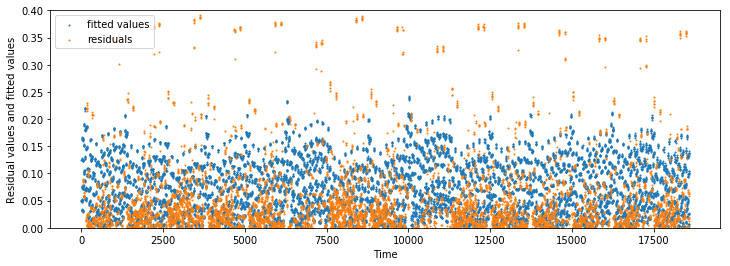

hidden_units:55
Test RMSE with cross validation: 0.0913186
Train RMSE with cross validation: 0.0883993

Fitted values vs. true values 


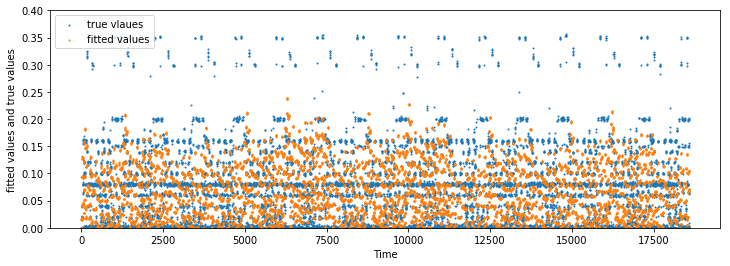

 residuals vs. ﬁtted values 


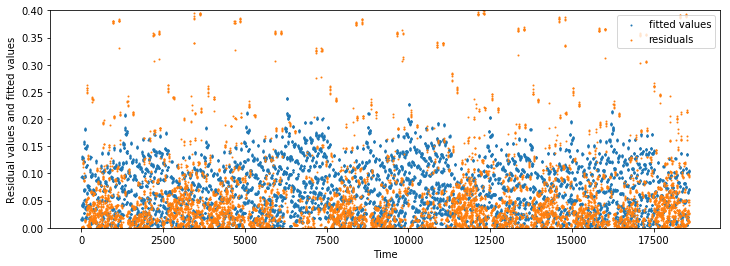

hidden_units:65
Test RMSE with cross validation: 0.0899202
Train RMSE with cross validation: 0.0884044

Fitted values vs. true values 


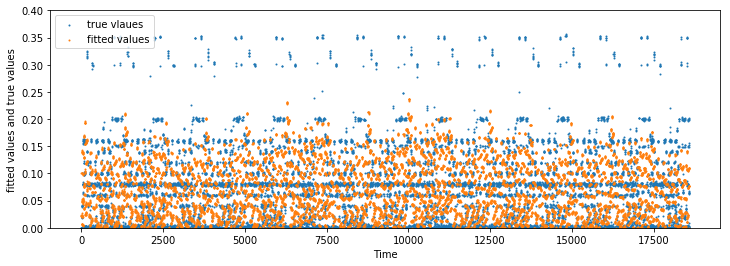

 residuals vs. ﬁtted values 


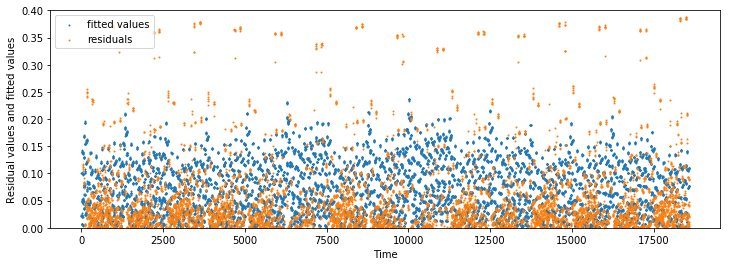

hidden_units:75
Test RMSE with cross validation: 0.0901195
Train RMSE with cross validation: 0.0885306

Fitted values vs. true values 


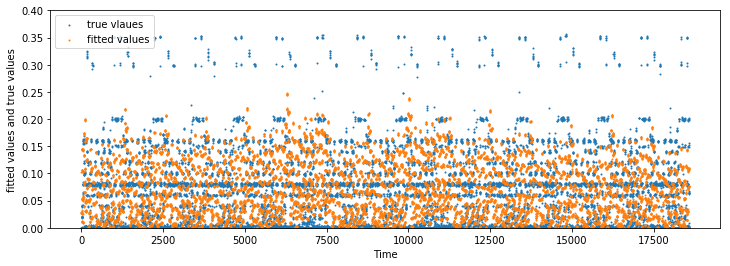

 residuals vs. ﬁtted values 


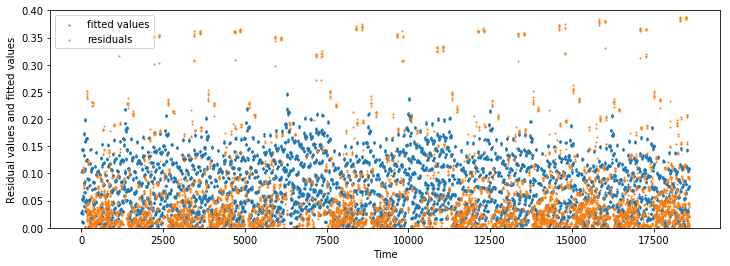

hidden_units:85
Test RMSE with cross validation: 0.0904659
Train RMSE with cross validation: 0.0884202

Fitted values vs. true values 


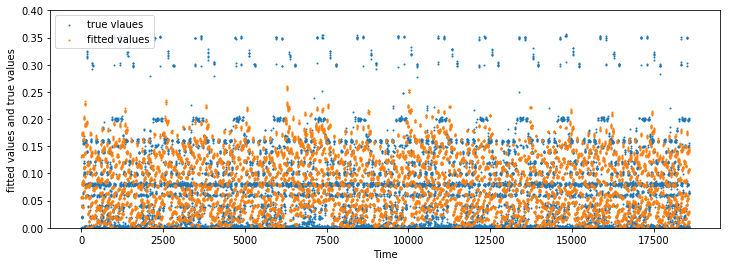

 residuals vs. ﬁtted values 


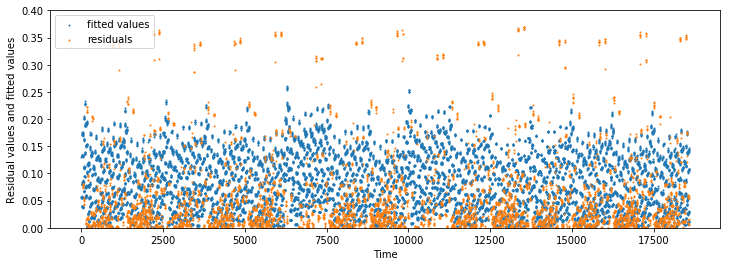

hidden_units:95
Test RMSE with cross validation: 0.0910180
Train RMSE with cross validation: 0.0886494

Fitted values vs. true values 


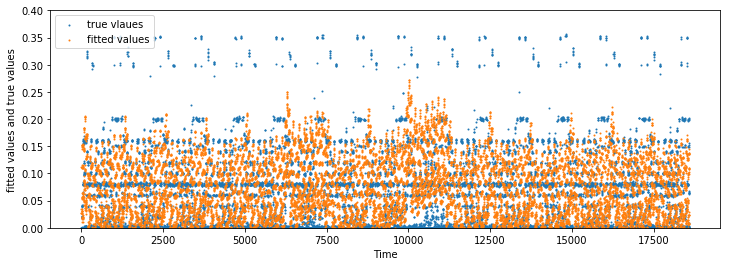

 residuals vs. ﬁtted values 


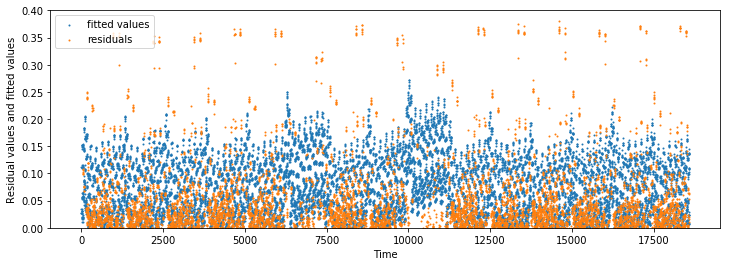

In [55]:
for hidden_units in range(5,105,10):
    print('hidden_units:%d'%hidden_units)
    clf_relu = MLPRegressor(activation='logistic', alpha=1e-5,hidden_layer_sizes=(hidden_units,), random_state=1)
    print_RMSEs_plot(X_enc,y,clf_relu)


hidden_units:5
Test RMSE with cross validation: 0.1004719
Train RMSE with cross validation: 0.0877765

Fitted values vs. true values 


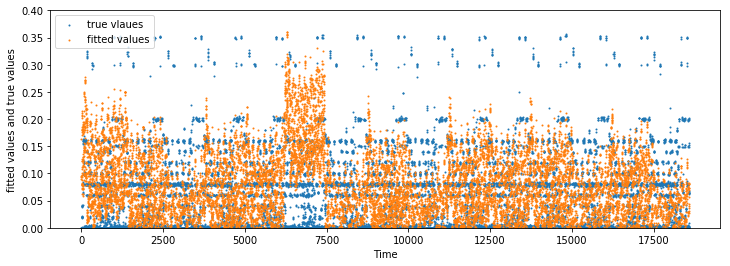

 residuals vs. ﬁtted values 


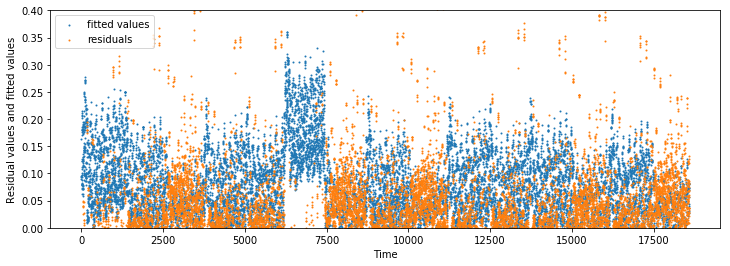

hidden_units:15
Test RMSE with cross validation: 0.1593951
Train RMSE with cross validation: 0.0885327

Fitted values vs. true values 


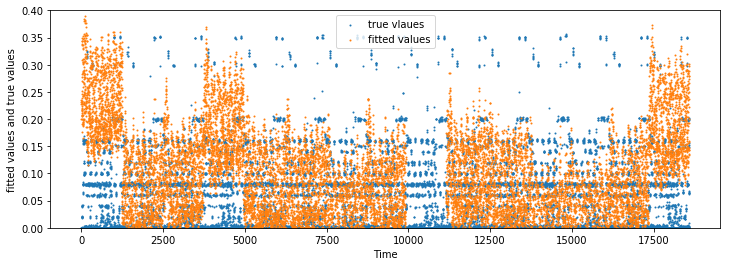

 residuals vs. ﬁtted values 


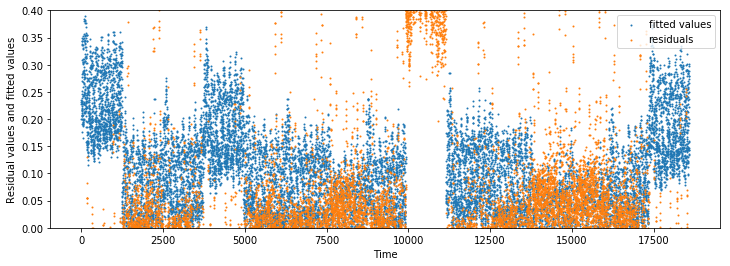

hidden_units:25
Test RMSE with cross validation: 0.1009656
Train RMSE with cross validation: 0.0530941

Fitted values vs. true values 


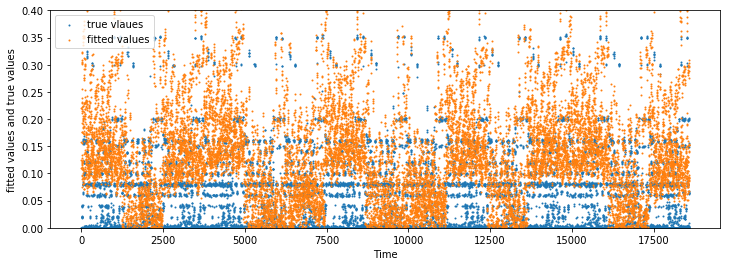

 residuals vs. ﬁtted values 


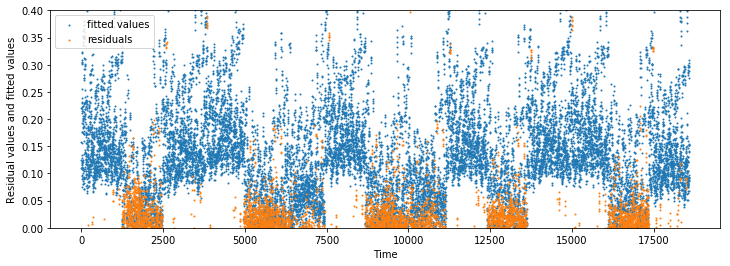

hidden_units:35
Test RMSE with cross validation: 0.0957010
Train RMSE with cross validation: 0.0637125

Fitted values vs. true values 


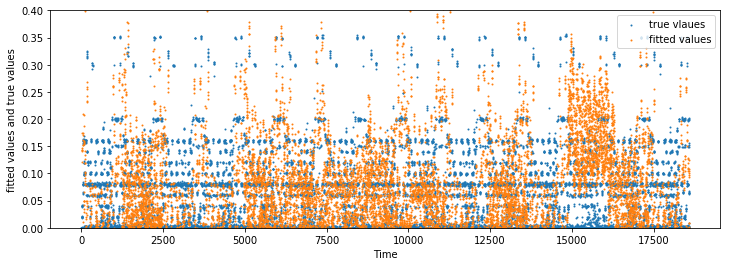

 residuals vs. ﬁtted values 


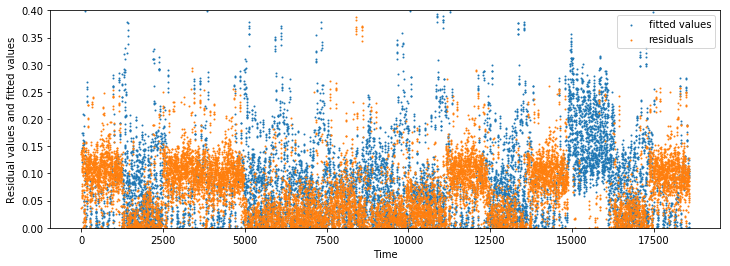

hidden_units:45
Test RMSE with cross validation: 0.0562576
Train RMSE with cross validation: 0.0526471

Fitted values vs. true values 


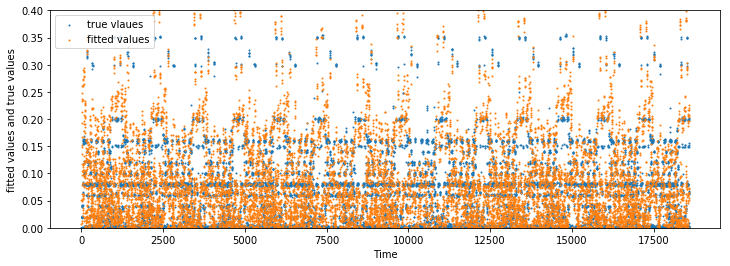

 residuals vs. ﬁtted values 


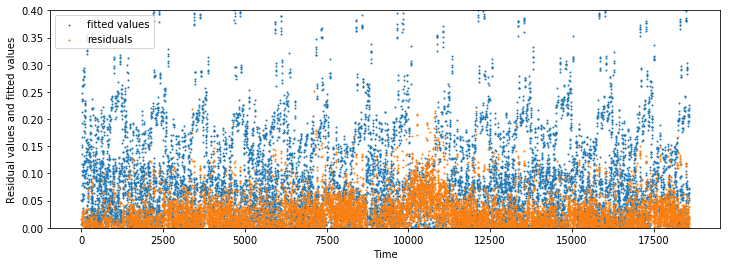

hidden_units:55
Test RMSE with cross validation: 0.0571316
Train RMSE with cross validation: 0.0548299

Fitted values vs. true values 


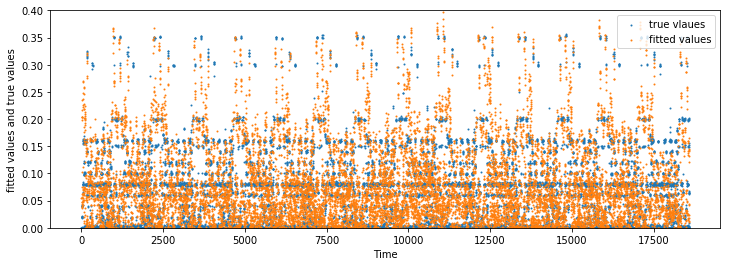

 residuals vs. ﬁtted values 


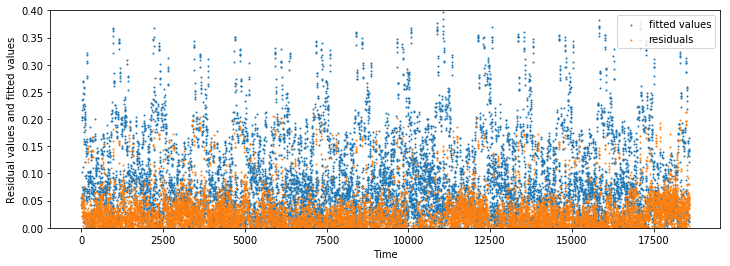

hidden_units:65
Test RMSE with cross validation: 0.1059473
Train RMSE with cross validation: 0.0887478

Fitted values vs. true values 


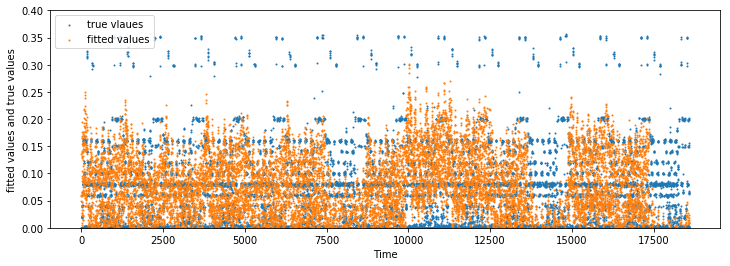

 residuals vs. ﬁtted values 


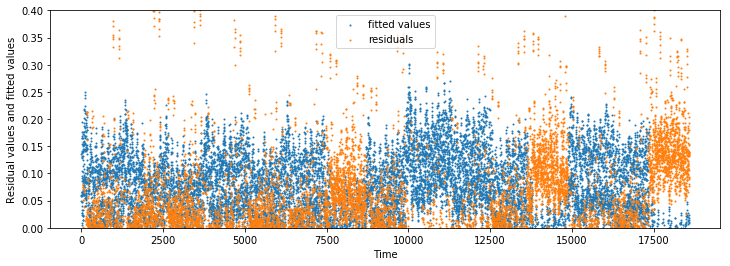

hidden_units:75
Test RMSE with cross validation: 0.1072888
Train RMSE with cross validation: 0.0889648

Fitted values vs. true values 


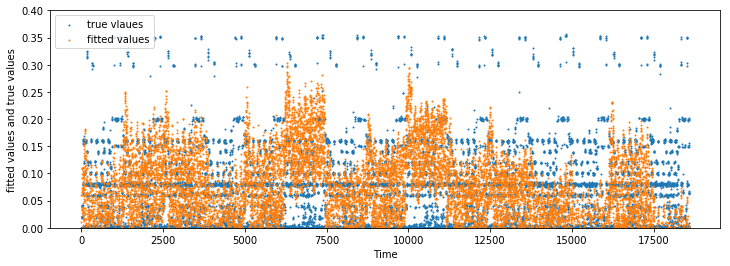

 residuals vs. ﬁtted values 


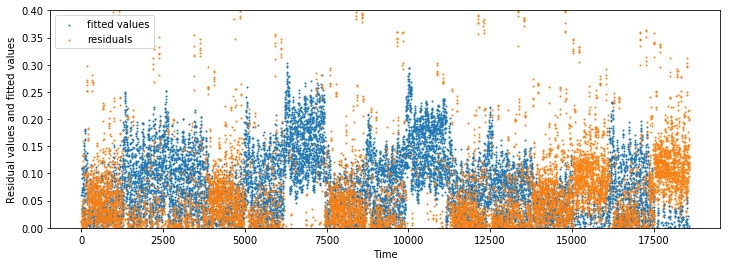

hidden_units:85
Test RMSE with cross validation: 0.0920817
Train RMSE with cross validation: 0.0761157

Fitted values vs. true values 


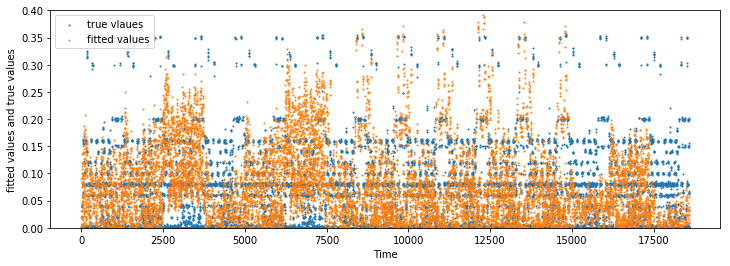

 residuals vs. ﬁtted values 


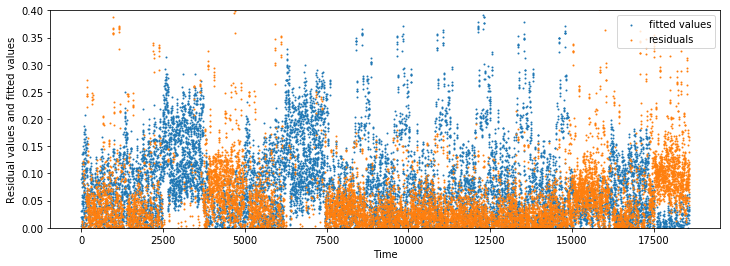

hidden_units:95
Test RMSE with cross validation: 0.1225303
Train RMSE with cross validation: 0.0880251

Fitted values vs. true values 


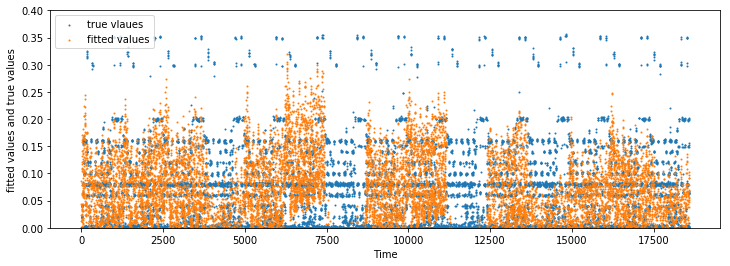

 residuals vs. ﬁtted values 


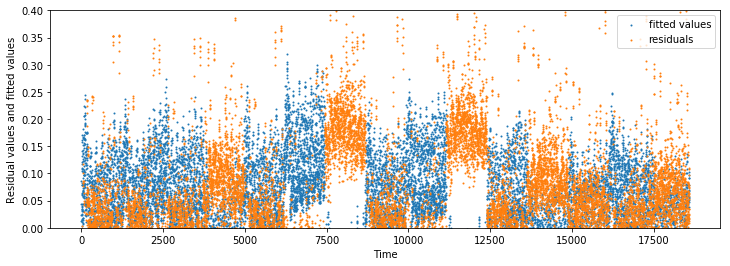

In [56]:
for hidden_units in range(5,105,10):
    print('hidden_units:%d'%hidden_units)
    clf_relu = MLPRegressor(activation='tanh', alpha=1e-5,hidden_layer_sizes=(hidden_units,), random_state=1)
    print_RMSEs_plot(X_enc,y,clf_relu)


# Predict the Backup size

workflow_ID 1
Test RMSE with cross validation: 0.0358870
Train RMSE with cross validation: 0.0358355

Fitted values vs. true values 


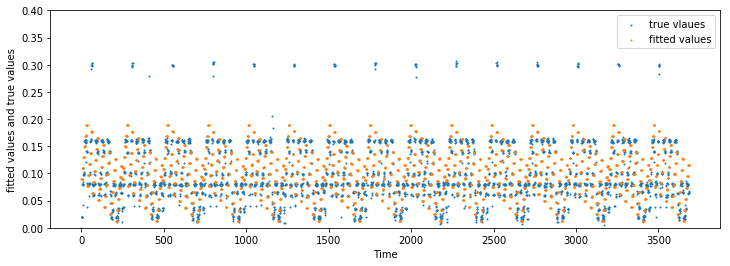

 residuals vs. ﬁtted values 


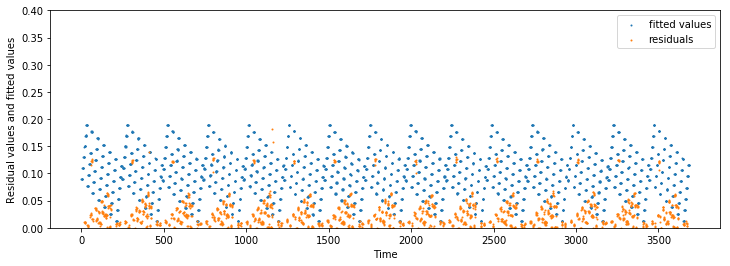

workflow_ID 2
Test RMSE with cross validation: 0.1489186
Train RMSE with cross validation: 0.1487660

Fitted values vs. true values 


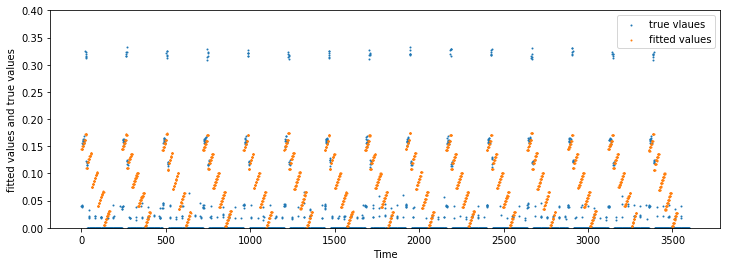

 residuals vs. ﬁtted values 


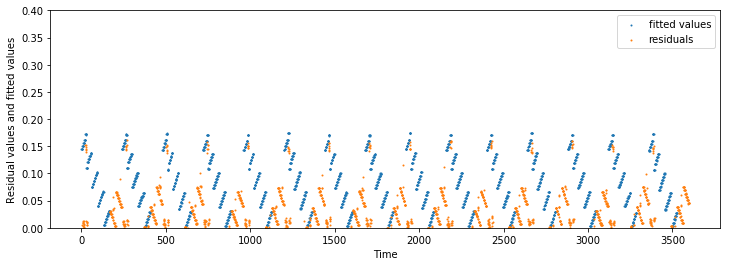

workflow_ID 3
Test RMSE with cross validation: 0.0430669
Train RMSE with cross validation: 0.0429093

Fitted values vs. true values 


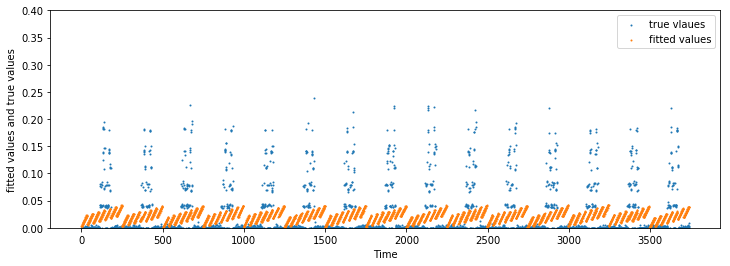

 residuals vs. ﬁtted values 


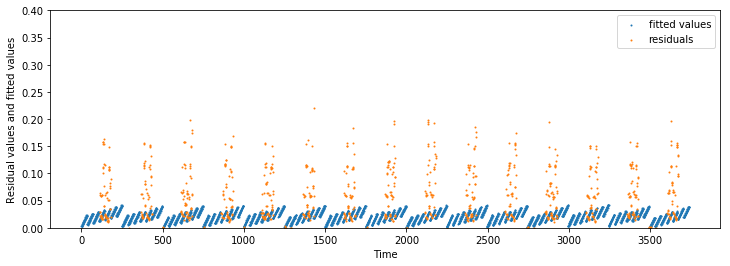

workflow_ID 4
Test RMSE with cross validation: 0.0072609
Train RMSE with cross validation: 0.0072439

Fitted values vs. true values 


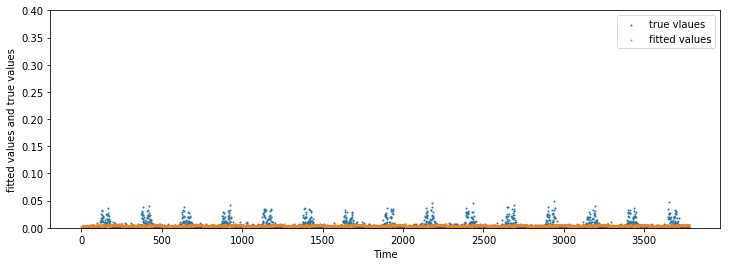

 residuals vs. ﬁtted values 


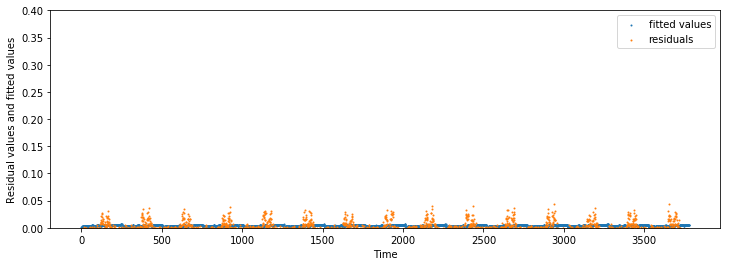

workflow_ID 5
Test RMSE with cross validation: 0.0859906
Train RMSE with cross validation: 0.0859219

Fitted values vs. true values 


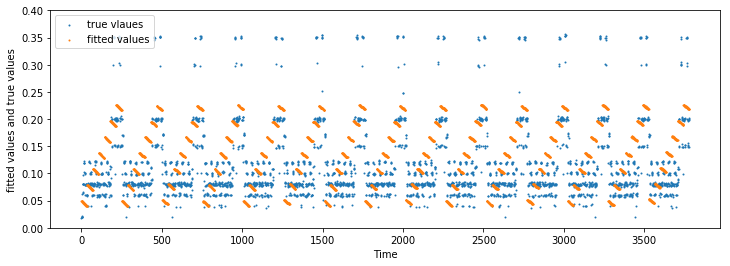

 residuals vs. ﬁtted values 


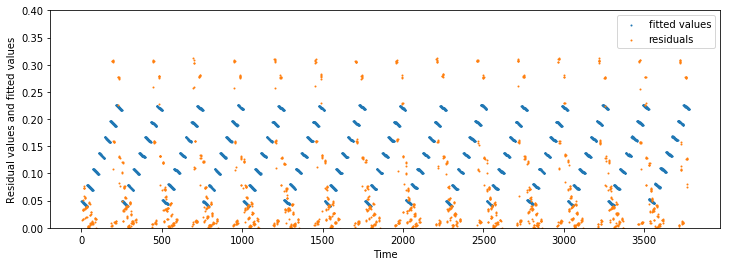

In [65]:
data1=data
data1= data1.groupby('work_flow')
linear_regression = linear_model.LinearRegression()
for workflow_ID, group in data1:
    print("workflow_ID %d"% workflow_ID)
    X_temp=group[['week', 'day_of_week', 'start_time', \
                  'work_flow','file_name']]
    y_temp=group['size']
    print_RMSEs_plot(X_temp,y_temp,linear_regression)

In [66]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn import datasets, linear_model, metrics
from sklearn.pipeline import make_pipeline

In [67]:
def Get_RMSEs(features,targets,model):
    cv_scores = cross_validate(model, features, targets, cv=10, scoring='neg_mean_squared_error',return_train_score=True)
    Test_RMSE=(sum(cv_scores['test_score'])/-10.0)**0.5
    Train_RMSE=(sum(cv_scores['train_score'])/-10.0)**0.5

    return Test_RMSE,Train_RMSE

In [69]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn import datasets, linear_model, metrics
from sklearn.pipeline import make_pipeline

Average_TestError=[]
Average_TrainError=[]

data2=data
for i in range(2,11):

    TempTestError=[]
    TempTrainError=[]
    poly = PolynomialFeatures(degree=i)
    print("calculating degree %d ..." %i)
    data3= data2.groupby('work_flow')
    for workflow_ID, group in data3:
        print("workflow_ID %d"% workflow_ID)
        X_temp=group[['week', 'day_of_week', 'start_time', \
                      'work_flow','file_name']]
        
        y_temp=group['size']

        X_new=poly.fit_transform(X_temp,y_temp)
        temp_Test_RMSE,temp_Train_RMSE=Get_RMSEs(X_new,y_temp,linear_regression)
        TempTestError.append(temp_Test_RMSE)
        TempTrainError.append(temp_Train_RMSE)
        
    Average_TestError.append(np.mean(TempTestError))
    Average_TrainError.append(np.mean(TempTrainError))

calculating degree 2 ...
workflow_ID 1
workflow_ID 2
workflow_ID 3
workflow_ID 4
workflow_ID 5
calculating degree 3 ...
workflow_ID 1
workflow_ID 2
workflow_ID 3
workflow_ID 4
workflow_ID 5
calculating degree 4 ...
workflow_ID 1
workflow_ID 2
workflow_ID 3
workflow_ID 4
workflow_ID 5
calculating degree 5 ...
workflow_ID 1
workflow_ID 2
workflow_ID 3
workflow_ID 4
workflow_ID 5
calculating degree 6 ...
workflow_ID 1
workflow_ID 2
workflow_ID 3
workflow_ID 4
workflow_ID 5
calculating degree 7 ...
workflow_ID 1
workflow_ID 2
workflow_ID 3
workflow_ID 4
workflow_ID 5
calculating degree 8 ...
workflow_ID 1
workflow_ID 2
workflow_ID 3
workflow_ID 4
workflow_ID 5
calculating degree 9 ...
workflow_ID 1
workflow_ID 2
workflow_ID 3
workflow_ID 4
workflow_ID 5
calculating degree 10 ...
workflow_ID 1
workflow_ID 2
workflow_ID 3
workflow_ID 4
workflow_ID 5


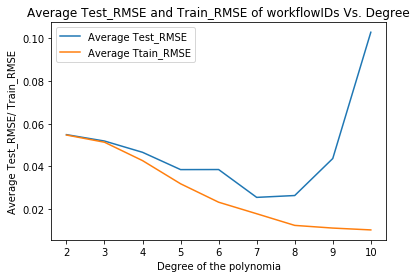

In [74]:
plt.plot(range(2,11),Average_TestError, label='Average Test_RMSE')
plt.plot(range(2,11),Average_TrainError, label='Average Ttain_RMSE')
plt.legend(loc='best')
plt.title("Average Test_RMSE and Train_RMSE of workflowIDs Vs. Degree")
plt.xlabel('Degree of the polynomia')
plt.ylabel('Average Test_RMSE/ Train_RMSE')
plt.show()

for degree equals to 7:
workflow_ID 1
Test RMSE with cross validation: 0.0120145
Train RMSE with cross validation: 0.0091111

Fitted values vs. true values 


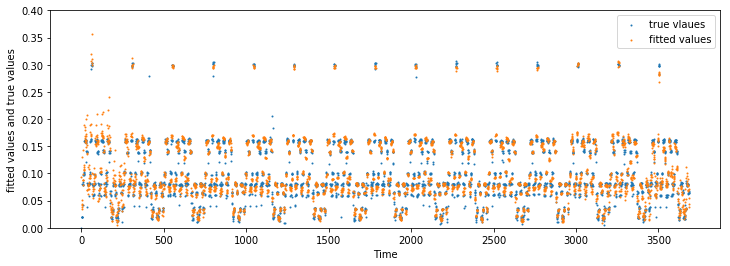

 residuals vs. ﬁtted values 


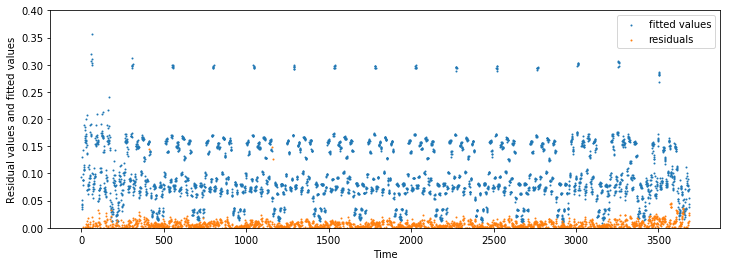

workflow_ID 2
Test RMSE with cross validation: 0.0226095
Train RMSE with cross validation: 0.0207529

Fitted values vs. true values 


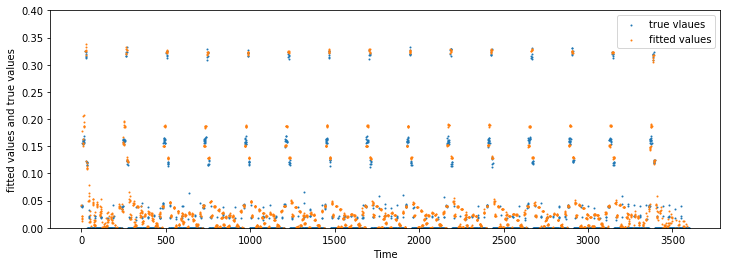

 residuals vs. ﬁtted values 


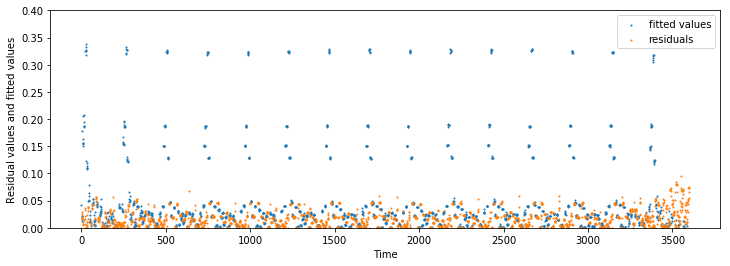

workflow_ID 3
Test RMSE with cross validation: 0.0313264
Train RMSE with cross validation: 0.0209678

Fitted values vs. true values 


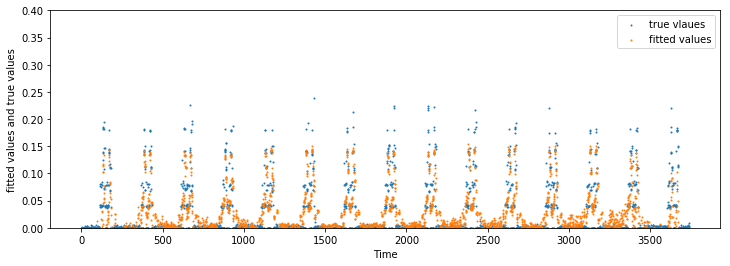

 residuals vs. ﬁtted values 


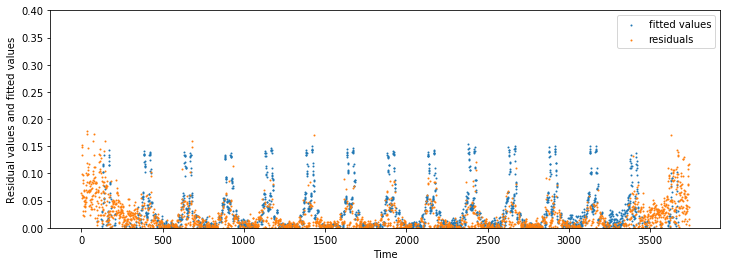

workflow_ID 4
Test RMSE with cross validation: 0.0075901
Train RMSE with cross validation: 0.0044999

Fitted values vs. true values 


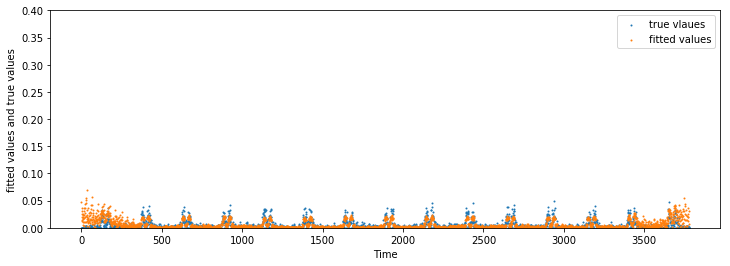

 residuals vs. ﬁtted values 


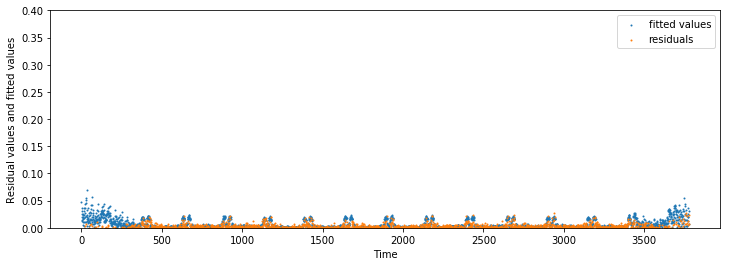

workflow_ID 5
Test RMSE with cross validation: 0.0537094
Train RMSE with cross validation: 0.0335749

Fitted values vs. true values 


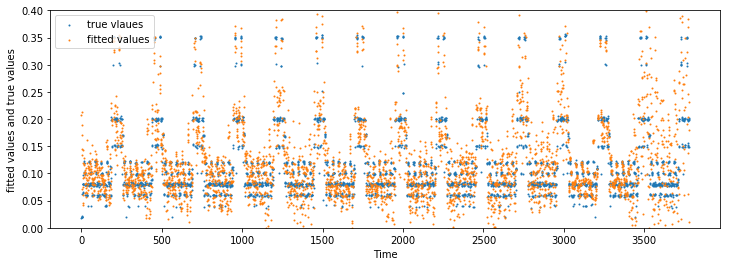

 residuals vs. ﬁtted values 


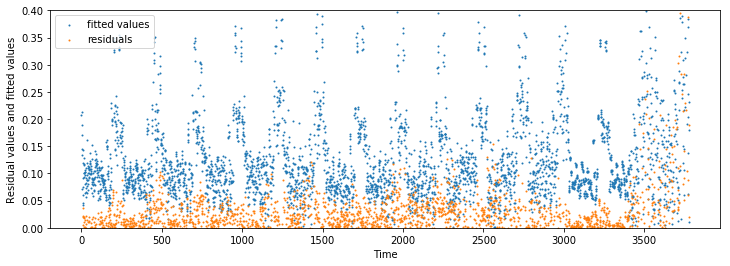

In [75]:
print("for degree equals to 7:")
data4=data
data4= data4.groupby('work_flow')
poly = PolynomialFeatures(degree=7)
for workflow_ID, group in data4:
    print("workflow_ID %d"% workflow_ID)
    X_temp=group[['week', 'day_of_week', 'start_time', \
                      'work_flow','file_name']]  
    y_temp=group['size']
    X_new=poly.fit_transform(X_temp,y_temp)
    print_RMSEs_plot(X_new,y_temp,linear_regression)

# k-nearest neighbor regression

k = 1
Test RMSE with cross validation: 0.0201658
Train RMSE with cross validation: 0.0000000

Fitted values vs. true values 


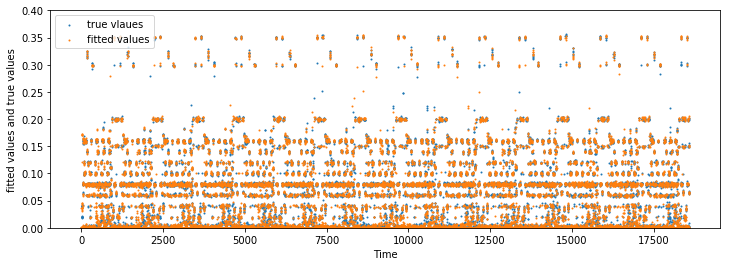

 residuals vs. ﬁtted values 


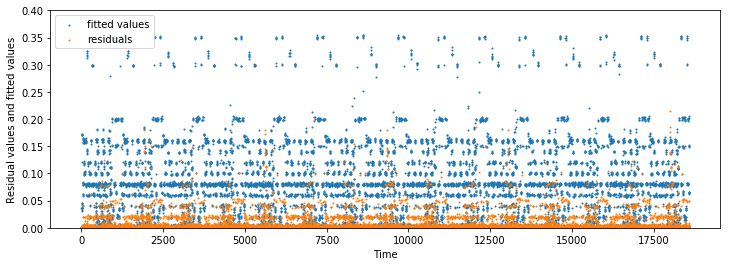

k = 2
Test RMSE with cross validation: 0.0343122
Train RMSE with cross validation: 0.0289562

Fitted values vs. true values 


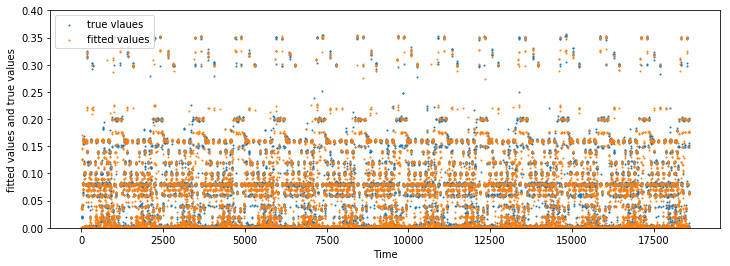

 residuals vs. ﬁtted values 


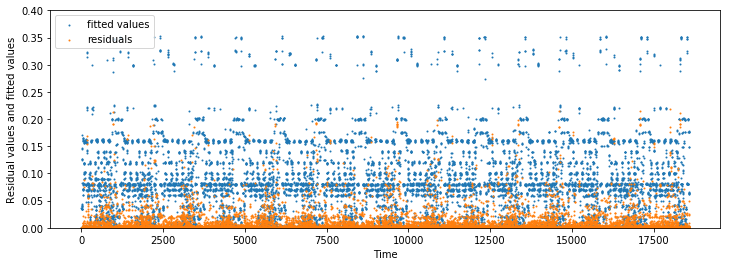

k = 3
Test RMSE with cross validation: 0.0363105
Train RMSE with cross validation: 0.0299732

Fitted values vs. true values 


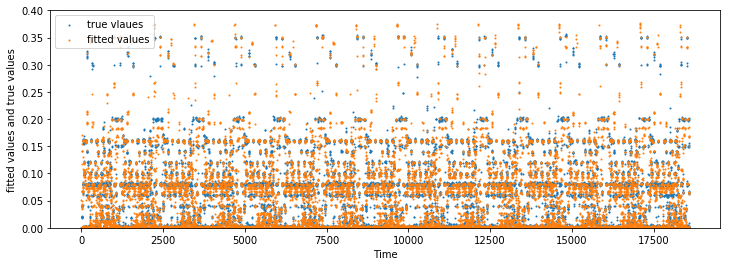

 residuals vs. ﬁtted values 


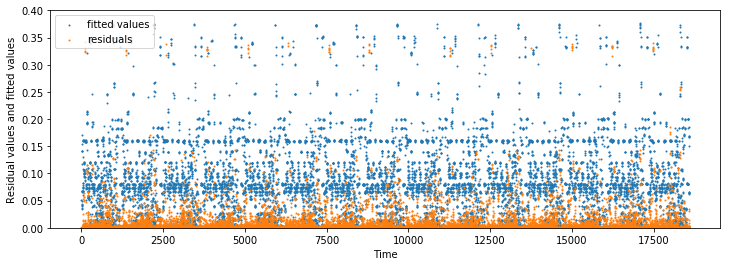

k = 4
Test RMSE with cross validation: 0.0374536
Train RMSE with cross validation: 0.0284126

Fitted values vs. true values 


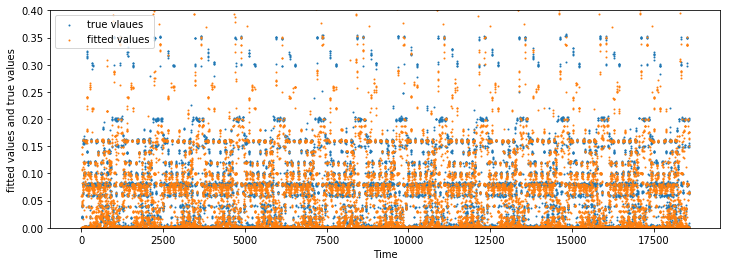

 residuals vs. ﬁtted values 


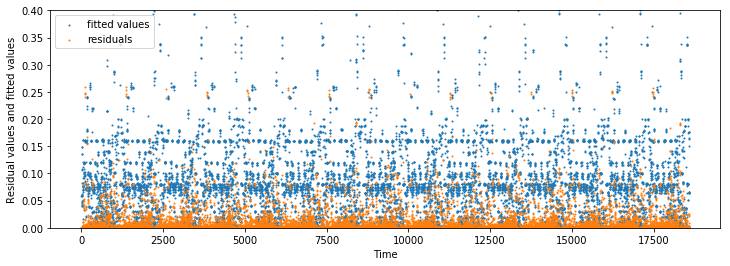

k = 5
Test RMSE with cross validation: 0.0433936
Train RMSE with cross validation: 0.0269626

Fitted values vs. true values 


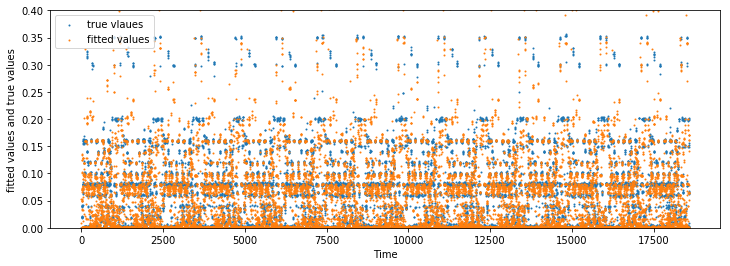

 residuals vs. ﬁtted values 


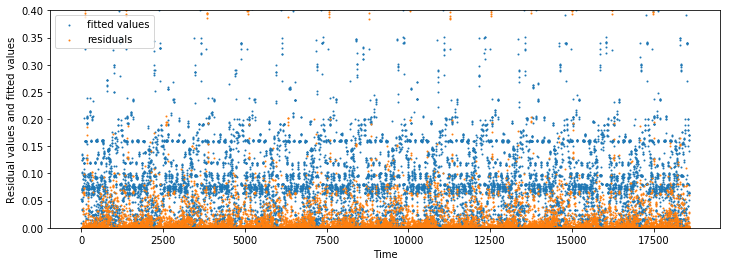

In [76]:
from sklearn.neighbors import KNeighborsRegressor

for k in range(1,6):
    print('k = %d'%k)
    knn = KNeighborsRegressor(n_neighbors=k)
    print_RMSEs_plot(X,y,knn)
    